# Unsupervised Learning Project
The data contains features extracted from the silhouette of vehicles in different angles. Four "Corgie" model vehicles were used for the experiment: a double decker bus, Cheverolet van, Saab 9000 and an Opel Manta 400 cars. This particular combination of vehicles was chosen with the expectation that the bus, van and either one of the cars would be readily distinguishable, but it would be more difficult to distinguish between the cars.

### Domain:
- Object recognition

### Context:
- The purpose is to classify a given silhouette as one of three types of vehicle, using a set of features extracted from the silhouette. The vehicle may be viewed from one of many different angles.

### Attribute Information: 
  - All the features are geometric features extracted from the silhouette.
  - All are numeric in nature.

### Learning Outcomes:

   - <b>Data pre-processing</b> - Understand the data and treat missing values (Use box plot), outliers.
   - <b>Understanding the attributes</b> - Find relationship between different attributes (Independent variables) and choose carefully which all attributes have to be a part of the analysis and why.
   - <b>Use PCA</b> from scikit learn and elbow plot to find out reduced number of dimension (which covers more than 95% of the variance).
   - <b>Use Support Vector Machine Classifier and Naïve Bayes Classifier</b> - Use grid search for SVC (try C values - 0.01, 0.05, 0.5, 1 and kernel = linear, rbf) and find out the best hyper parameters and do cross validation to find the accuracy.
    
### Objective:
- Apply dimensionality reduction technique – PCA and train a model using principle components instead of training the model using just the raw data.

## 1. Data pre-processing – Perform all the necessary preprocessing on the data ready to be fed to an Unsupervised algorithm
### 1.1 Import all the necessary libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
random_state = 42
np.random.seed(random_state)
import warnings
warnings.filterwarnings('ignore')

from sklearn.preprocessing import RobustScaler
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import precision_recall_fscore_support, mean_absolute_error
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, cross_val_score, learning_curve
from sklearn.metrics import multilabel_confusion_matrix,classification_report,f1_score,accuracy_score, recall_score, precision_score,roc_auc_score,roc_curve,auc
# calculate accuracy measures and confusion matrix
from sklearn import metrics

from sklearn.svm import SVC
from sklearn import svm
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier

### 1.2 Read the data

In [2]:
# Read the dataframe using pandas or import the dataset using pandas df
vehicle_df = pd.read_csv('vehicle-1.csv') 

In [3]:
vehicle_df.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


#### Observations
- Target Variable is <b>class</b> which describe the type of vehicle. This is the variable which we need to group.
- Except the last column which our target variable, remaining columns are numeric.

### 1.3 Copying data to preserve the original data

In [4]:
vehicle = vehicle_df.copy(deep = True)

### 1.4 Shape the data

In [5]:
rows_count, columns_count = vehicle.shape
print('Total Number of rows :', rows_count)
print('Total Number of columns :', columns_count)

Total Number of rows : 846
Total Number of columns : 19


In [6]:
vehicle.columns

Index(['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio', 'class'],
      dtype='object')

#### Observations
- Shape of the <b>Vehicle</b> dataframe is (846, 19). There are 846 rows and 19 columns in the dataset.

### 1.5 Data type of each attribute

In [7]:
vehicle.dtypes

compactness                      int64
circularity                    float64
distance_circularity           float64
radius_ratio                   float64
pr.axis_aspect_ratio           float64
max.length_aspect_ratio          int64
scatter_ratio                  float64
elongatedness                  float64
pr.axis_rectangularity         float64
max.length_rectangularity        int64
scaled_variance                float64
scaled_variance.1              float64
scaled_radius_of_gyration      float64
scaled_radius_of_gyration.1    float64
skewness_about                 float64
skewness_about.1               float64
skewness_about.2               float64
hollows_ratio                    int64
class                           object
dtype: object

In [8]:
vehicle.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  846 non-null    int64  
 1   circularity                  841 non-null    float64
 2   distance_circularity         842 non-null    float64
 3   radius_ratio                 840 non-null    float64
 4   pr.axis_aspect_ratio         844 non-null    float64
 5   max.length_aspect_ratio      846 non-null    int64  
 6   scatter_ratio                845 non-null    float64
 7   elongatedness                845 non-null    float64
 8   pr.axis_rectangularity       843 non-null    float64
 9   max.length_rectangularity    846 non-null    int64  
 10  scaled_variance              843 non-null    float64
 11  scaled_variance.1            844 non-null    float64
 12  scaled_radius_of_gyration    844 non-null    float64
 13  scaled_radius_of_gyr

#### Observations
- Here we can see that all the variables are numerical except the last variable, <b>Class</b>.

### 1.6 Finding unique data

In [9]:
vehicle.apply(lambda x: len(x.unique()))

compactness                     44
circularity                     28
distance_circularity            64
radius_ratio                   135
pr.axis_aspect_ratio            38
max.length_aspect_ratio         21
scatter_ratio                  132
elongatedness                   36
pr.axis_rectangularity          14
max.length_rectangularity       66
scaled_variance                129
scaled_variance.1              423
scaled_radius_of_gyration      144
scaled_radius_of_gyration.1     40
skewness_about                  24
skewness_about.1                42
skewness_about.2                31
hollows_ratio                   31
class                            3
dtype: int64

### 1.7 5 point summary of numerical attributes

In [10]:
vehicle.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
compactness,846.0,93.678487,8.234474,73.0,87.00,93.0,100.0,119.0
circularity,841.0,44.828775,6.152172,33.0,40.00,44.0,49.0,59.0
distance_circularity,842.0,82.110451,15.778292,40.0,70.00,80.0,98.0,112.0
radius_ratio,840.0,168.888095,33.520198,104.0,141.00,167.0,195.0,333.0
pr.axis_aspect_ratio,844.0,61.678910,7.891463,47.0,57.00,61.0,65.0,138.0
max.length_aspect_ratio,846.0,8.567376,4.601217,2.0,7.00,8.0,10.0,55.0
scatter_ratio,845.0,168.901775,33.214848,112.0,147.00,157.0,198.0,265.0
elongatedness,845.0,40.933728,7.816186,26.0,33.00,43.0,46.0,61.0
pr.axis_rectangularity,843.0,20.582444,2.592933,17.0,19.00,20.0,23.0,29.0
max.length_rectangularity,846.0,147.998818,14.515652,118.0,137.00,146.0,159.0,188.0


#### Observation
- compactness: Range of Q1 to Q3 is between 87 to 100. It appears that the column is almost normally distributed.
- circularity: Range of Q1 to Q3 is 40 to 49. This column too appears to be almost normally distributed.
- distance_circularity: Range of Q1 to Q3 is 70 to 98. Mean is slightly greater than median, we can say that the column is slightly skewed towards right.
- radius_ratio: Range of Q1 to Q3 is 141 to 195. Mean is slightly greater than median, we can say that the column is slightly skewed towards right.
- pr.axis_aspect_ratio: Range of Q1 to Q3 is 57 to 65. Mean is slightly greater than median, we can say that the column is slightly skewed towards right.
- max.length_aspect_ratio: Range of Q1 to Q3 is 7 to 10. Mean is slightly greater than median, we can say that the column is slightly skewed towards right.
- scatter_ratio: Range of Q1 to Q3 is 147 to 198. Mean is greater than median, we can say that the column is skewed towards right.
- elongatedness: Range of Q1 to Q3 is 33 to 46. Mean is less than median, we can say that the column is skewed towards left.
- pr.axis_rectangularity: Range of Q1 to Q3 is 19 to 23. Mean is greater than median, we can say that the column is skewed towards right.
- max.length_rectangularity: Range of Q1 to Q3 is 137 to 159. Mean is greater than median, we can say that the column is skewed towards right.
- scaled_variance: Range of Q1 to Q3 is 167 to 217. Mean is grater than median, we can say that the column is skewed towards right.
- scaled_variance.1: Range of Q1 to Q3 is 318 to 587. Mean is greater than median, we can say that the column is skewed towards right.
- scaled_radius_of_gyration: Range of Q1 to Q3 is 149 to 198. Mean is greater than median, we can say that the column is skewed towards right.
- scaled_radius_of_gyration.1: Range of Q1 to Q3 is 67 to 75. Mean is greater than median, we can say that the column is skewed towards right.
- skewness_about: Range of Q1 to Q3 is 2 to 6. Mean is greater than median, skewed towards right.
- skewness_about.1: Range of Q1 to Q3 is 5 to 19. Mean is greater than median, skewed towards right.
- skewness_about.2: Range of Q1 to Q3 is 184 to 193. Mean is slightly greater than median, almost normally distributed.
- hollows_ratio: Range of Q1 to Q3 is 197 to 211. Mean is less than median, skewed towards left.

In [11]:
columns = vehicle.loc[:, vehicle.dtypes == 'object'].columns.tolist()
for cols in columns:
    print(f'Unique values for {cols} is \n{vehicle[cols].unique()}\n')
del cols, columns

Unique values for class is 
['van' 'car' 'bus']



In [12]:
display(vehicle['class'].value_counts(), vehicle['class'].value_counts(normalize = True)*100)

car    429
bus    218
van    199
Name: class, dtype: int64

car    50.709220
bus    25.768322
van    23.522459
Name: class, dtype: float64

In [13]:
replace_struc = {'car': 3, 'bus': 2, 'van': 1}
vehicle['class'] = vehicle['class'].map(replace_struc)
del replace_struc

### 1.8 Check for the Duplicate and Null values

In [14]:
print('Duplicated rows :', vehicle[vehicle.duplicated()].shape[0]) #no duplicate rows

Duplicated rows : 0


In [15]:
#null values
vehicle.isnull().sum() 

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

#### We will replace the missing values with the median values of that particular column.

In [16]:
null_columns = vehicle.columns[vehicle.isnull().any()]; columns = list(vehicle.columns)

print('Descriptive Stats before imputation for columns with missing values: \n', '--'*30)
display(vehicle[null_columns].describe().T)

# Using SimpleImputer to fill missing values by median
impute = SimpleImputer(missing_values = np.nan, strategy = 'median', verbose = 1)
vehicle = pd.DataFrame(impute.fit_transform(vehicle), columns = columns)

print('Descriptive Stats after imputation: \n', '--'*30)
display(vehicle[null_columns].describe().T)

del null_columns

Descriptive Stats before imputation for columns with missing values: 
 ------------------------------------------------------------


,count,mean,std,min,25%,50%,75%,max
circularity,841.0,44.828775,6.152172,33.0,40.0,44.0,49.0,59.0
distance_circularity,842.0,82.110451,15.778292,40.0,70.0,80.0,98.0,112.0
radius_ratio,840.0,168.888095,33.520198,104.0,141.0,167.0,195.0,333.0
pr.axis_aspect_ratio,844.0,61.678910,7.891463,47.0,57.0,61.0,65.0,138.0
scatter_ratio,845.0,168.901775,33.214848,112.0,147.0,157.0,198.0,265.0
elongatedness,845.0,40.933728,7.816186,26.0,33.0,43.0,46.0,61.0
pr.axis_rectangularity,843.0,20.582444,2.592933,17.0,19.0,20.0,23.0,29.0
scaled_variance,843.0,188.631079,31.411004,130.0,167.0,179.0,217.0,320.0
scaled_variance.1,844.0,439.494076,176.666903,184.0,318.0,363.5,587.0,1018.0
scaled_radius_of_gyration,844.0,174.709716,32.584808,109.0,149.0,173.5,198.0,268.0


Descriptive Stats after imputation: 
 ------------------------------------------------------------


,count,mean,std,min,25%,50%,75%,max
circularity,846.0,44.823877,6.134272,33.0,40.00,44.0,49.00,59.0
distance_circularity,846.0,82.100473,15.741569,40.0,70.00,80.0,98.00,112.0
radius_ratio,846.0,168.874704,33.401356,104.0,141.00,167.0,195.00,333.0
pr.axis_aspect_ratio,846.0,61.677305,7.882188,47.0,57.00,61.0,65.00,138.0
scatter_ratio,846.0,168.887707,33.197710,112.0,147.00,157.0,198.00,265.0
elongatedness,846.0,40.936170,7.811882,26.0,33.00,43.0,46.00,61.0
pr.axis_rectangularity,846.0,20.580378,2.588558,17.0,19.00,20.0,23.00,29.0
scaled_variance,846.0,188.596927,31.360427,130.0,167.00,179.0,217.00,320.0
scaled_variance.1,846.0,439.314421,176.496341,184.0,318.25,363.5,586.75,1018.0
scaled_radius_of_gyration,846.0,174.706856,32.546277,109.0,149.00,173.5,198.00,268.0


#### After imputation
- A quick observation after imputating the missing values: medians remain unchanged while mean changes slightly not significantly. Type of skewness remain unchanged.

In [17]:
vehicle.isnull().values.any()

False

No missing values present


<AxesSubplot:>

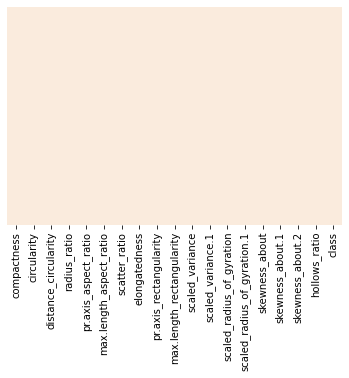

In [18]:
val = vehicle.isnull().values.any()
if val == True:
    print("Missing values present : ", loan.isnull().values.sum())
else:
    print("No missing values present")
    
#Missing value Visualization 
sns.heatmap(vehicle.isna(), yticklabels=False, cbar=False, cmap="rocket_r")

#### Observations
-  From the above heatmap graph we can see that there is no missing value present as we have replaced them with median.

### 1.9 Functions for plotting various graphs

In [19]:
sns.set_style("whitegrid")
# Functions that will help us with EDA plot
def odp_plots(vehicle, col):
    f,(ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (20, 5.2))
    
    # Boxplot to check outliers
    sns.boxplot(x = col, data = vehicle, ax = ax1, orient = 'v', color = 'darkslategrey')
    
    # Distribution plot with outliers
    sns.distplot(vehicle[col], ax = ax2, color = 'teal').set_title(f'{col} with outliers')
    
    # Removing outliers, but in a new dataframe
    upperbound, lowerbound = np.percentile(vehicle[col], [1, 99])
    y = pd.DataFrame(np.clip(vehicle[col], upperbound, lowerbound))
    
    # Distribution plot without outliers
    sns.distplot(y[col], ax = ax3, color = 'tab:orange').set_title(f'{col} without outliers')
    
    kwargs = {'fontsize':14, 'color':'black'}
    ax1.set_title(col + ' Boxplot Analysis', **kwargs)
    ax1.set_xlabel('Box', **kwargs)
    ax1.set_ylabel(col + ' Values', **kwargs)

    return plt.show()

# function for ploting distribution of variables with target
def target_plot(vehicle, col1, col2, col3, target = 'class'):
    f,(ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (15, 7.2))
    f.suptitle(f'Distribution for Car, Bus, Van for {col1.capitalize()}, {col2.capitalize()}, {col3.capitalize()}', 
               fontsize = 14)
    # Distribution for col1 considering outliers
    sns.distplot(vehicle[(vehicle[target] == 3)][col1], color = 'c', ax = ax1, hist = False, 
                 label = 'Car').set_title(f'{col1.capitalize()}')
    sns.distplot(vehicle[(vehicle[target] == 2)][col1], color = 'b', ax = ax1, hist = False, 
                 label = 'Bus').set_title(f'{col1.capitalize()}')
    sns.distplot(vehicle[(vehicle[target] == 1)][col1], color = 'm', ax = ax1, hist = False, 
                 label = 'Van').set_title(f'{col1.capitalize()}')

    # Distribution for col2 considering outliers
    sns.distplot(vehicle[(vehicle[target] == 3)][col2], color = 'c', ax = ax2, hist = False, 
                 label = 'Car').set_title(f'{col2.capitalize()}')
    sns.distplot(vehicle[(vehicle[target] == 2)][col2], color = 'b', ax = ax2, hist = False, 
                 label = 'Bus').set_title(f'{col2.capitalize()}')
    sns.distplot(vehicle[(vehicle[target] == 1)][col2], color = 'm', ax = ax2, hist = False, 
                 label = 'Van').set_title(f'{col2.capitalize()}')

    # Distribution for col3 considering outliers
    sns.distplot(vehicle[(vehicle[target] == 3)][col3], color = 'c', ax = ax3, hist = False, 
                 label = 'Car').set_title(f'{col3.capitalize()}')
    sns.distplot(vehicle[(vehicle[target] == 2)][col3], color = 'b', ax = ax3, hist = False, 
                 label = 'Bus').set_title(f'{col3.capitalize()}')
    sns.distplot(vehicle[(vehicle[target] == 1)][col3], color = 'm', ax = ax3, hist = False, 
                 label = 'Van').set_title(f'{col3.capitalize()}')
    return plt.show()

# Correlation matrix for all variables
def correlation_matrix(vehicle, threshold = 0.8):
    corr = vehicle.corr()
    mask = np.zeros_like(corr, dtype = np.bool)
    mask[np.triu_indices_from(mask)] = True
    f, ax = plt.subplots(figsize = (15, 7.2))
    cmap = sns.diverging_palette(220, 10, as_cmap = True)
    sns.heatmap(corr, mask = mask, cmap = cmap, square = True, linewidths = .5, cbar_kws = {"shrink": .5})#, annot = True)
    ax.set_title('Correlation Matrix of Data')

    # Filter for correlation value greater than threshold
    sort = corr.abs().unstack()
    sort = sort.sort_values(kind = "quicksort", ascending = False)
    display(sort[(sort > threshold) & (sort < 1)])


# Helper function for PCA plots
def pca_plots(vehicle, col1, col2, xlabel, ylabel, ax):
    ax.set_xlabel(xlabel); ax.set_ylabel(ylabel)
    ax.set_title(f'{xlabel} vs {ylabel}', fontsize = 14)
    targets = [3, 2, 1]; colors = ['r', 'g', 'b']
    for target, color in zip(targets, colors):
        indicesToKeep = vehicle['class'] == target
        ax.scatter(vehicle.loc[indicesToKeep, col1], vehicle.loc[indicesToKeep, col2], c = color, s = 50)
    ax.legend(targets)    
    
# Helper function to plot learning curve
def plot_learning_curve(estimator, X, y,  ax, ylim = None, cv = None, n_jobs = 1,
                        train_sizes = np.linspace(.1, 1.0, 5), name = 'SVM \n Principal Compoents Learning Curve'):    
    if ylim is not None:
        plt.ylim(*ylim)
        
    # First Estimator
    train_sizes, train_scores, test_scores = learning_curve(estimator, X, y, cv = cv, n_jobs = n_jobs, 
                                                            train_sizes = train_sizes)
    train_scores_mean = np.mean(train_scores, axis = 1)
    train_scores_std = np.std(train_scores, axis = 1)
    test_scores_mean = np.mean(test_scores, axis = 1)
    test_scores_std = np.std(test_scores, axis = 1)

    ax.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, 
                     alpha = 0.1, color = '#ff9124')
    ax.fill_between(train_sizes, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, 
                     alpha = 0.1, color = '#2492ff')

    ax.plot(train_sizes, train_scores_mean, 'o-', color = '#ff9124', label = 'Training score')
    ax.plot(train_sizes, test_scores_mean, 'o-', color ='#2492ff', label = 'Cross-validation score')
    ax.set_title(name, fontsize = 14)
    ax.set_xlabel('Training size')
    ax.set_ylabel('Score')
    ax.grid(True)
    ax.legend(loc = 'best')

### 1.10 Check for the Outliers

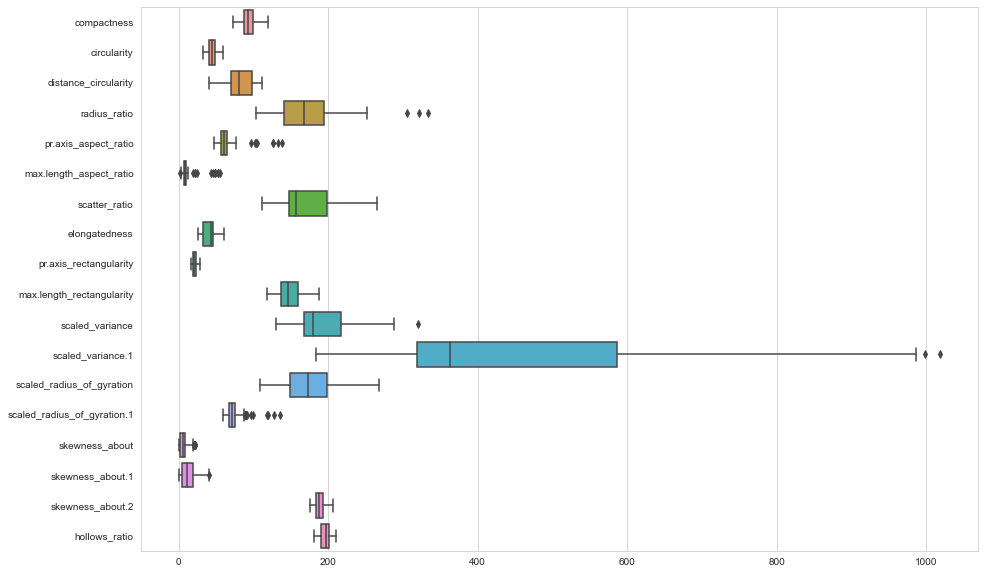

In [20]:
# Plot the central tendency of the dataset, To check presence of outliers
fig = plt.figure(figsize = (15,10))
ax = sns.boxplot(data = vehicle.iloc[:, 0:18], orient = 'h')

#### Observations - One can see that, following column attributes are affected by the outliers:
- radius_ratio (above third quartile)
- pr.axis_aspect_ratio (above third quartile)
- max_length_aspect_ratio (above third quartile and below first quartile)
- scaled_variance (above third quartile)
- scaled_variance.1 (above third quartile)
- scaled_radius_of_gyration.1 (above third quartile)
- skewness_about (above third quartile)
- skewness_about.1 (above third quartile)


For better clarity we will plot box plots of indivdual columns.

Text(0.5, 1.0, 'Boxplot of Skewness About Column')

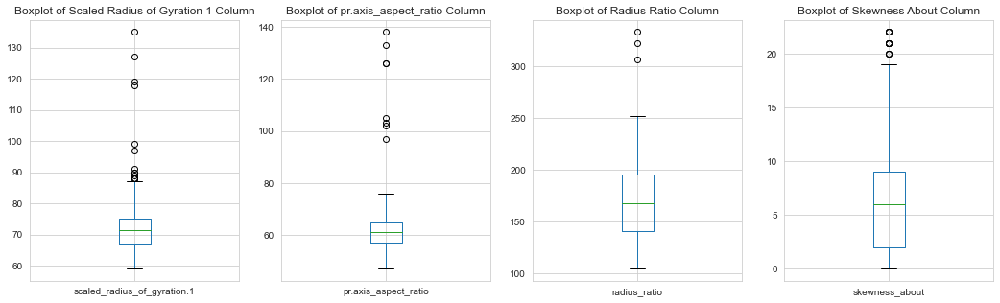

In [21]:
plt.figure(figsize = (18, 5))

plt.subplot(1, 4, 1)
vehicle['scaled_radius_of_gyration.1'].plot(x = 'scaled_radius_of_gyration.1', kind = 'box')
plt.title('Boxplot of Scaled Radius of Gyration 1 Column')


plt.subplot(1, 4, 2)
vehicle['pr.axis_aspect_ratio'].plot(x = 'pr.axis_aspect_ratio', kind = 'box')
plt.title('Boxplot of pr.axis_aspect_ratio Column')

plt.subplot(1, 4, 3)
vehicle.radius_ratio.plot(x = 'radius_ratio', kind = 'box')
plt.title('Boxplot of Radius Ratio Column')


plt.subplot(1, 4, 4)
vehicle.skewness_about.plot(x = 'skewness_about', kind = 'box')
plt.title('Boxplot of Skewness About Column')

#### Observations
- Columns - scaled_radius_of_gyration.1 and pr.axis_aspect_ratio have most outliers amongst the total number of outliers present in multiple columns.

Text(0.5, 1.0, 'Boxplot of Max.Length Aspect Ratio Column')

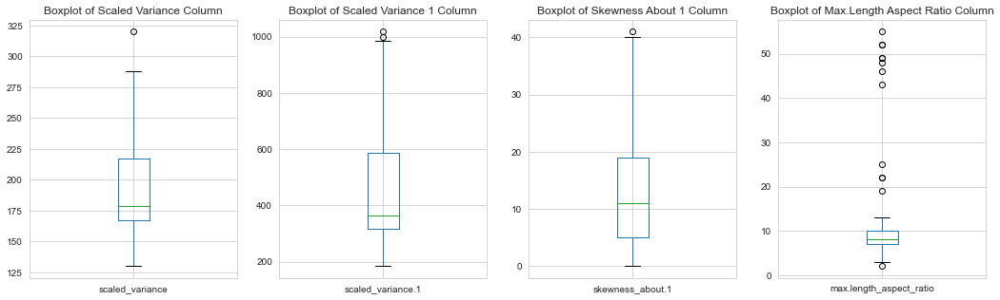

In [22]:
plt.figure(figsize = (18, 5))

plt.subplot(1, 4, 1)
vehicle.scaled_variance.plot(x = 'scaled_variance', kind = 'box')
plt.title('Boxplot of Scaled Variance Column')

plt.subplot(1, 4, 2)
vehicle['scaled_variance.1'].plot(x = 'scaled_variance.1', kind = 'box')
plt.title('Boxplot of Scaled Variance 1 Column')

plt.subplot(1, 4, 3)
vehicle['skewness_about.1'].plot(x = 'skewness_about.1 ', kind = 'box')
plt.title('Boxplot of Skewness About 1 Column')

plt.subplot(1, 4, 4)
vehicle['max.length_aspect_ratio'].plot(x = 'max.length_aspect_ratio ', kind = 'box')
plt.title('Boxplot of Max.Length Aspect Ratio Column')

#### Observations
- <b>radius_ratio</b> and <b>scaled_variances</b> have a wide spread of data as indicated by the large difference of min and max values of their distribution.
- Large difference between min and 1st quartile and/or 3rd quartile and max values indicates potential outliers. Hence <b>radius_ratio</b>, <b>pr.axis_aspect_ratio</b>, <b>max.length_aspect_ratio</b>, <b>scaled_variance</b>, <b>scaled_variance.1</b>, <b>scaled_radius_of_gyration.1</b>, <b>skewness_about</b>, <b>skewness_about.1</b> features contain outliers.
- Min value 0 of <b>skewness_about</b>, <b>skewness_about.1</b> indicates these two features contain 0s in their distribution.

Radius_ratio column --------------------------------------------------------------------------------


3

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
37,90.0,48.0,86.0,306.0,126.0,49.0,153.0,44.0,19.0,156.0,272.0,346.0,200.0,118.0,0.0,15.0,185.0,194.0,1.0
135,89.0,47.0,83.0,322.0,133.0,48.0,158.0,43.0,20.0,163.0,229.0,364.0,176.0,97.0,0.0,14.0,184.0,194.0,1.0
388,94.0,47.0,85.0,333.0,138.0,49.0,155.0,43.0,19.0,155.0,320.0,354.0,187.0,135.0,12.0,9.0,188.0,196.0,1.0


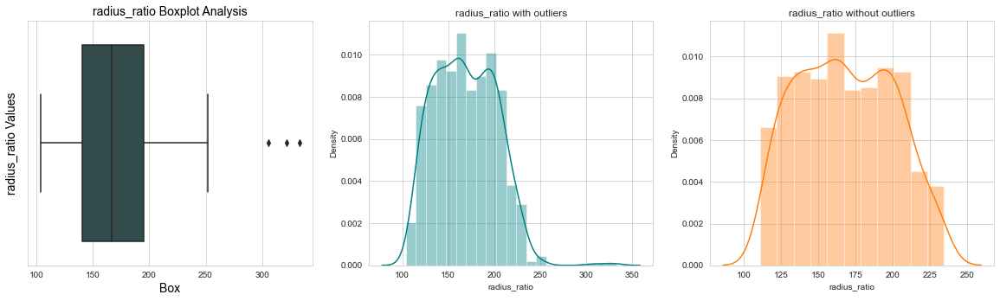

Pr.axis_aspect_ratio column --------------------------------------------------------------------------------


8

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
4,85.0,44.0,70.0,205.0,103.0,52.0,149.0,45.0,19.0,144.0,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183.0,2.0
37,90.0,48.0,86.0,306.0,126.0,49.0,153.0,44.0,19.0,156.0,272.0,346.0,200.0,118.0,0.0,15.0,185.0,194.0,1.0
100,82.0,45.0,66.0,252.0,126.0,52.0,148.0,45.0,19.0,144.0,237.0,326.0,185.0,119.0,1.0,1.0,181.0,185.0,2.0
135,89.0,47.0,83.0,322.0,133.0,48.0,158.0,43.0,20.0,163.0,229.0,364.0,176.0,97.0,0.0,14.0,184.0,194.0,1.0
291,89.0,45.0,81.0,246.0,102.0,43.0,155.0,44.0,20.0,160.0,200.0,347.0,177.0,90.0,9.0,17.0,183.0,192.0,1.0


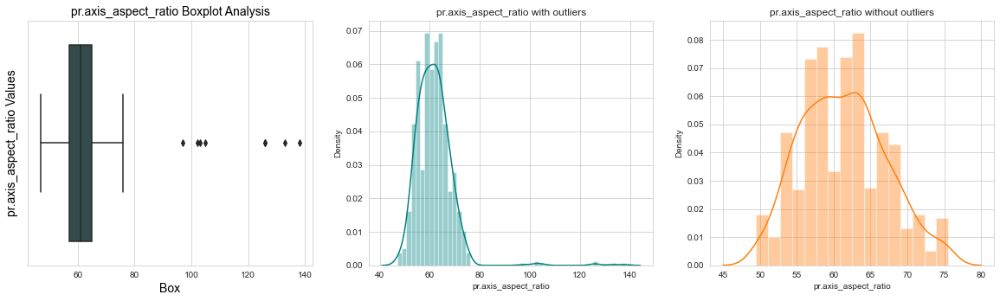

Max.length_aspect_ratio column --------------------------------------------------------------------------------


13

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
4,85.0,44.0,70.0,205.0,103.0,52.0,149.0,45.0,19.0,144.0,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183.0,2.0
37,90.0,48.0,86.0,306.0,126.0,49.0,153.0,44.0,19.0,156.0,272.0,346.0,200.0,118.0,0.0,15.0,185.0,194.0,1.0
100,82.0,45.0,66.0,252.0,126.0,52.0,148.0,45.0,19.0,144.0,237.0,326.0,185.0,119.0,1.0,1.0,181.0,185.0,2.0
127,85.0,41.0,66.0,155.0,65.0,22.0,149.0,45.0,19.0,139.0,173.0,330.0,155.0,75.0,6.0,16.0,184.0,191.0,2.0
135,89.0,47.0,83.0,322.0,133.0,48.0,158.0,43.0,20.0,163.0,229.0,364.0,176.0,97.0,0.0,14.0,184.0,194.0,1.0


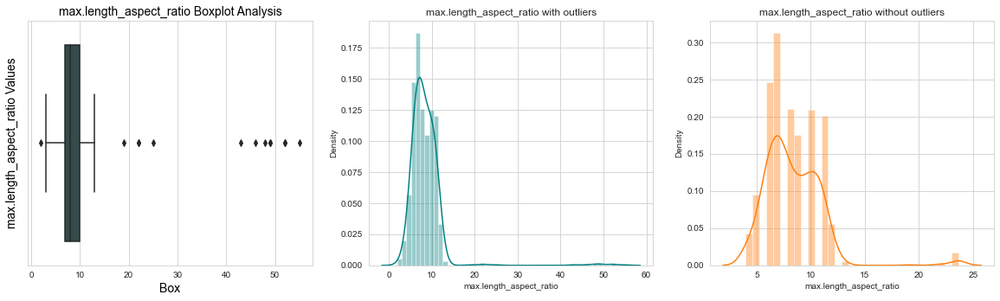

Scaled_variance column --------------------------------------------------------------------------------


1

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
388,94.0,47.0,85.0,333.0,138.0,49.0,155.0,43.0,19.0,155.0,320.0,354.0,187.0,135.0,12.0,9.0,188.0,196.0,1.0


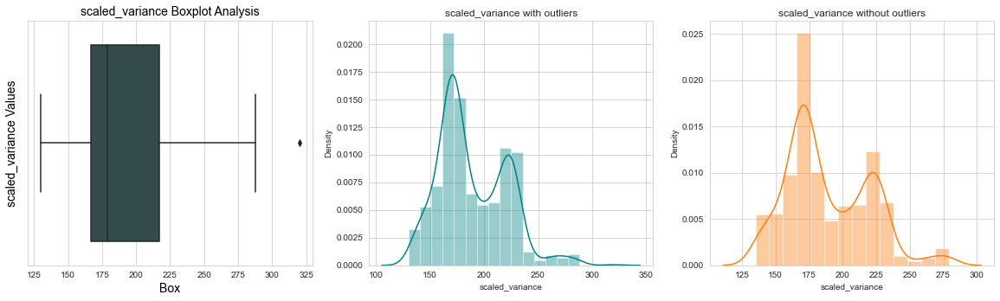

Scaled_variance.1 column --------------------------------------------------------------------------------


2

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
85,110.0,58.0,106.0,180.0,51.0,6.0,261.0,26.0,28.0,171.0,278.0,998.0,257.0,83.0,9.0,13.0,181.0,182.0,2.0
835,111.0,58.0,105.0,183.0,51.0,6.0,265.0,26.0,29.0,174.0,285.0,1018.0,255.0,85.0,4.0,8.0,181.0,183.0,2.0


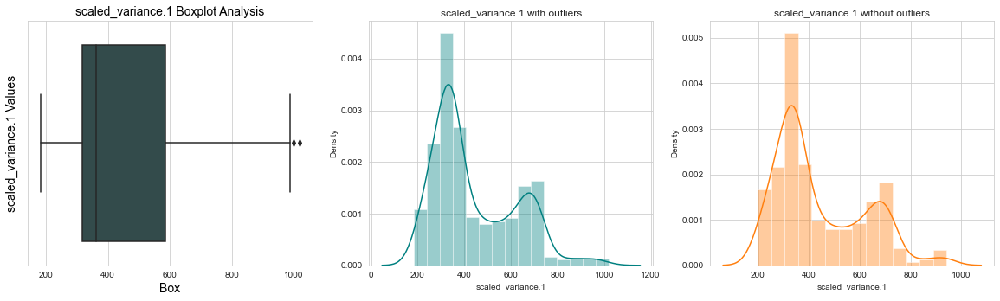

Scaled_radius_of_gyration.1 column --------------------------------------------------------------------------------


15

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
4,85.0,44.0,70.0,205.0,103.0,52.0,149.0,45.0,19.0,144.0,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183.0,2.0
37,90.0,48.0,86.0,306.0,126.0,49.0,153.0,44.0,19.0,156.0,272.0,346.0,200.0,118.0,0.0,15.0,185.0,194.0,1.0
47,85.0,42.0,66.0,122.0,54.0,6.0,148.0,46.0,19.0,141.0,172.0,317.0,174.0,88.0,6.0,14.0,180.0,182.0,2.0
79,89.0,44.0,68.0,113.0,50.0,7.0,150.0,45.0,19.0,147.0,171.0,328.0,189.0,88.0,6.0,5.0,179.0,182.0,2.0
100,82.0,45.0,66.0,252.0,126.0,52.0,148.0,45.0,19.0,144.0,237.0,326.0,185.0,119.0,1.0,1.0,181.0,185.0,2.0


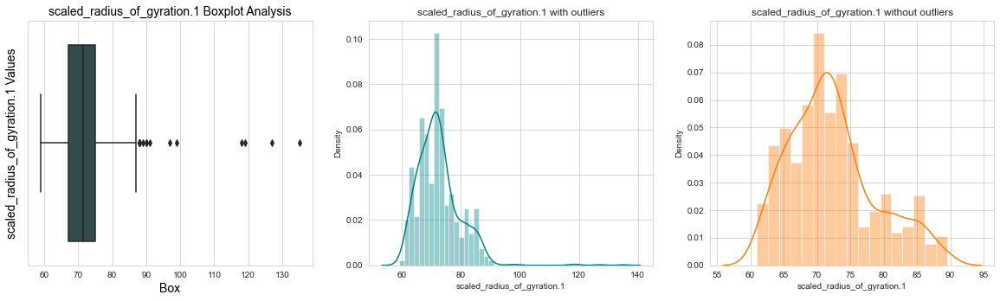

Skewness_about column --------------------------------------------------------------------------------


12

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
44,119.0,54.0,106.0,220.0,65.0,12.0,213.0,31.0,24.0,167.0,223.0,675.0,232.0,66.0,20.0,1.0,192.0,202.0,3.0
113,88.0,35.0,50.0,121.0,58.0,5.0,114.0,59.0,17.0,122.0,132.0,192.0,138.0,74.0,21.0,4.0,182.0,187.0,3.0
123,90.0,36.0,57.0,130.0,57.0,6.0,121.0,56.0,17.0,127.0,137.0,216.0,132.0,68.0,22.0,23.0,190.0,195.0,3.0
190,97.0,48.0,94.0,198.0,63.0,9.0,181.0,36.0,21.0,155.0,200.0,494.0,189.0,64.0,20.0,11.0,199.0,203.0,3.0
346,117.0,52.0,110.0,228.0,65.0,12.0,212.0,31.0,24.0,163.0,228.0,668.0,220.0,66.0,21.0,25.0,194.0,205.0,3.0


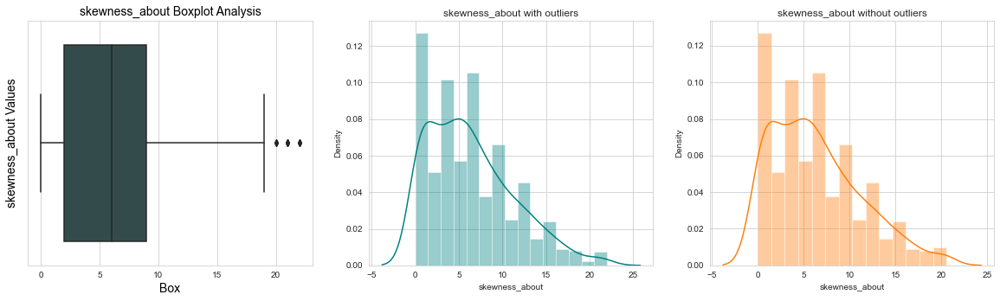

Skewness_about.1 column --------------------------------------------------------------------------------


1

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
132,97.0,42.0,101.0,186.0,59.0,9.0,186.0,36.0,22.0,138.0,208.0,511.0,168.0,67.0,7.0,41.0,194.0,206.0,3.0


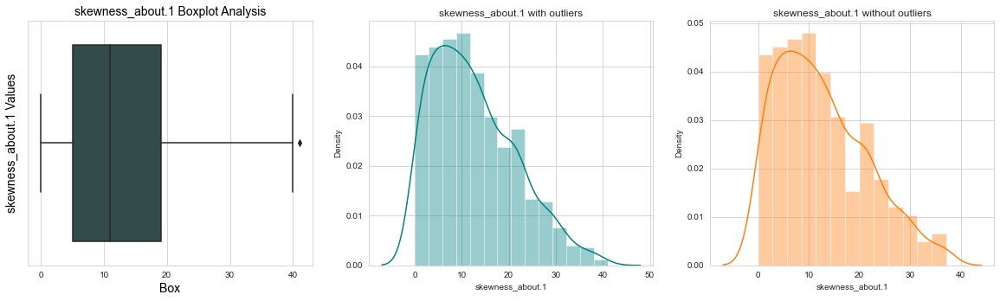

In [23]:
# Outlier, distribution for columns with outliers
boxplotcolumns = ['radius_ratio', 'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scaled_variance', 'scaled_variance.1',
                  'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1']
for cols in boxplotcolumns:
    Q3 = vehicle[cols].quantile(0.75)
    Q1 = vehicle[cols].quantile(0.25)
    IQR = Q3 - Q1

    print(f'{cols.capitalize()} column', '--'*40)
    display(len(vehicle.loc[(vehicle[cols] < (Q1 - 1.5 * IQR)) | (vehicle[cols] > (Q3 + 1.5 * IQR))]), 
            vehicle.loc[(vehicle[cols] < (Q1 - 1.5 * IQR)) | (vehicle[cols] > (Q3 + 1.5 * IQR))].head())
    odp_plots(vehicle, cols)

del cols, IQR, boxplotcolumns

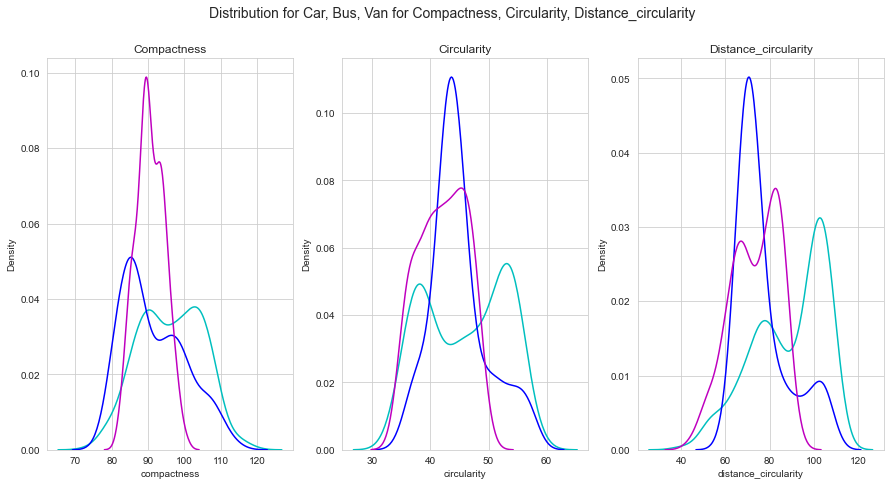

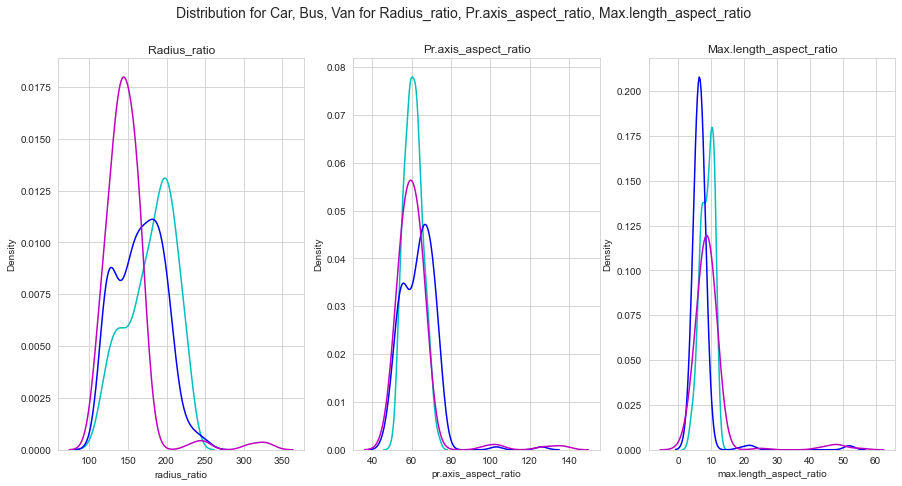

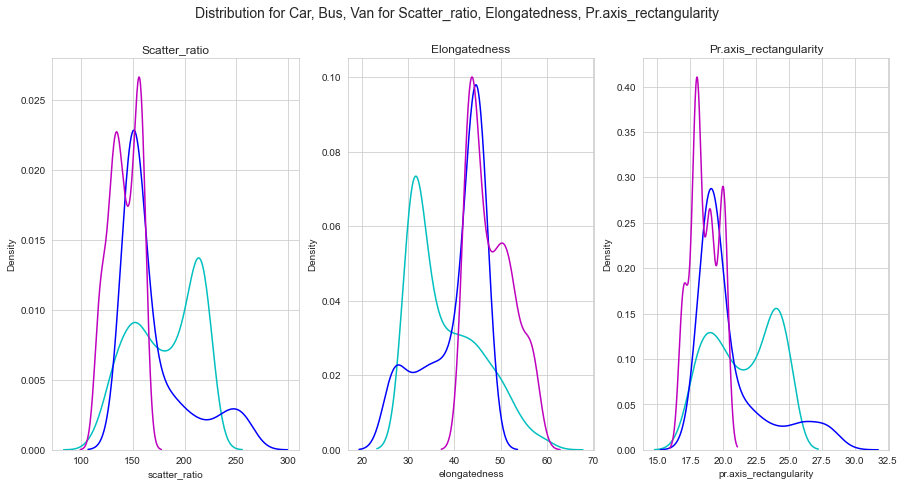

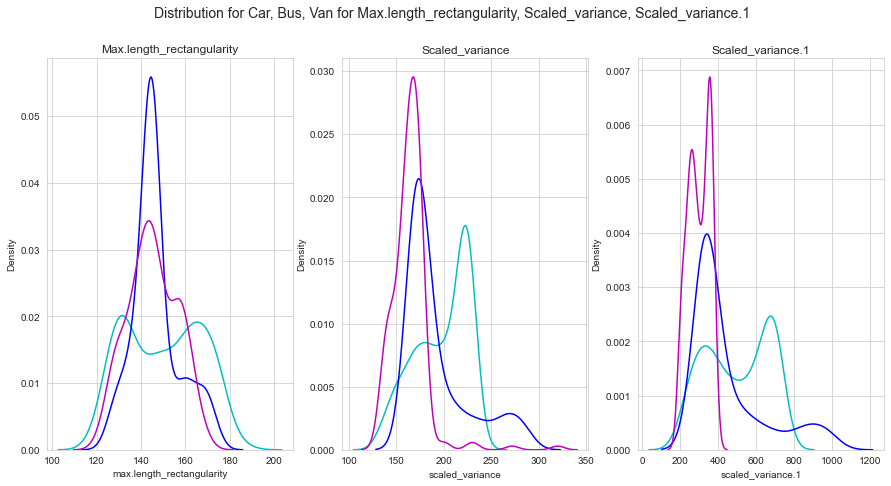

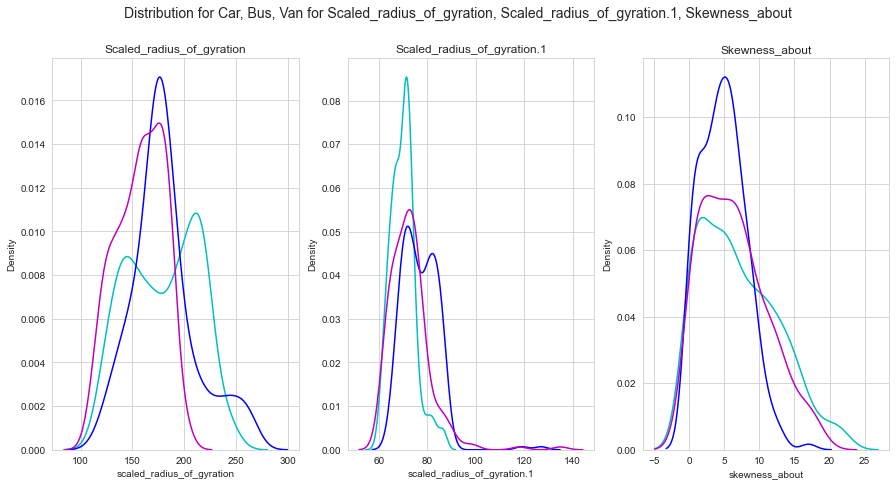

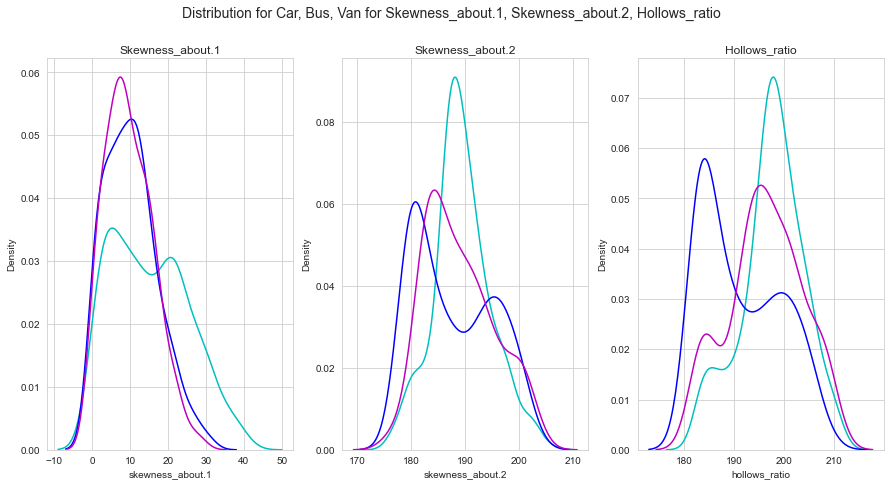

In [24]:
# Distribution of col by target variable
target_plot(vehicle, 'compactness', 'circularity', 'distance_circularity')
target_plot(vehicle, 'radius_ratio', 'pr.axis_aspect_ratio', 'max.length_aspect_ratio')
target_plot(vehicle, 'scatter_ratio', 'elongatedness', 'pr.axis_rectangularity')
target_plot(vehicle, 'max.length_rectangularity', 'scaled_variance', 'scaled_variance.1')
target_plot(vehicle, 'scaled_radius_of_gyration', 'scaled_radius_of_gyration.1', 'skewness_about')
target_plot(vehicle, 'skewness_about.1', 'skewness_about.2', 'hollows_ratio')

#### Observations
- Used box plot for the features of the vehicle dataframe. Found that radius_ratio, pr.axis_aspect_ratio, max.length_aspect_ratio, scaled_variance, scaled_variance.1, scaled_radius_of_gyration.1, skewness_about, skewness_about.1 columns has outliers.
- Used quantile method to check outliers in these column. It appears that scaled_radius_of_gyration.1 has maximum outliers around 15 of them, which represents about 1.77% of number of rows.
- It appears that removing outliers below 25% percentile and above 75% percentile will bring most of the columns to almost normal distribution. That would mean losing around 1.77% of the data.
- Let's not to that, rather replace these outliers with null values and then replace those nulls with median values to avoid losing data.

### Outlier Treatement
- <b>Min/Max Replacement</b>: There are 8 features present in the dataset which contains outliers. Outliers will be replaced by their nearest whisker ends in the central tendency. Means datapoints which are $1.5*IQR$ below the $Q_1$ will be replaced by min of lower whisker and which are $1.5*IQR$ above the $Q_3$ will be replaced by max of higher whisker.

In [25]:
# Treat the outlier data points
for col_name in vehicle.drop(columns = 'class').columns:
    q1 = vehicle[col_name].quantile(0.25)
    q3 = vehicle[col_name].quantile(0.75)
    iqr = q3 - q1
    
    low = q1 - 1.5 * iqr
    high = q3 + 1.5 * iqr
    
    vehicle.loc[(vehicle[col_name] < low) | (vehicle[col_name] > high), col_name] = vehicle[col_name].median()

In [26]:
# Removing outliers with upper and lower percentile values being 75 and 25, respectively
vehicle_im = vehicle.copy(deep = True)
outliers_cols = ['radius_ratio', 'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scaled_variance', 'scaled_variance.1',
           'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1']

for col in outliers_cols:
    Q3 = vehicle_im[col].quantile(0.75)
    Q1 = vehicle_im[col].quantile(0.25)
    IQR = Q3 - Q1
    upper_lim = Q3 + (1.5 * IQR)
    lower_lim = Q1 - (1.5 * IQR)
    vehicle_im.loc[(vehicle_im[col] < lower_lim) | (vehicle_im[col] > upper_lim), col] = np.nan

print('Column for which outliers where removed with upper and lower percentile values: \n', outliers_cols)

Column for which outliers where removed with upper and lower percentile values: 
 ['radius_ratio', 'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1']


In [27]:
vehicle_im.isnull().sum()

compactness                    0
circularity                    0
distance_circularity           0
radius_ratio                   0
pr.axis_aspect_ratio           0
max.length_aspect_ratio        0
scatter_ratio                  0
elongatedness                  0
pr.axis_rectangularity         0
max.length_rectangularity      0
scaled_variance                0
scaled_variance.1              0
scaled_radius_of_gyration      0
scaled_radius_of_gyration.1    0
skewness_about                 0
skewness_about.1               0
skewness_about.2               0
hollows_ratio                  0
class                          0
dtype: int64

In [28]:
# Using SimpleImputer to fill missing values by median
print('Descriptive Stats before handling outliers: \n', '--'*30)
display(vehicle[outliers_cols].describe().T)

columns = list(vehicle_im.columns)
impute = SimpleImputer(missing_values = np.nan, strategy = 'median', verbose = 1)
vehicle_im = pd.DataFrame(impute.fit_transform(vehicle_im), columns = columns)

print('Descriptive Stats after handling outliers: \n', '--'*30)
display(vehicle_im[outliers_cols].describe().T)
del outliers_cols, vehicle

Descriptive Stats before handling outliers: 
 ------------------------------------------------------------


,count,mean,std,min,25%,50%,75%,max
radius_ratio,846.0,168.330969,32.147908,104.0,141.00,167.0,194.75,252.0
pr.axis_aspect_ratio,846.0,61.154846,5.613458,47.0,57.00,61.0,65.00,76.0
max.length_aspect_ratio,846.0,8.118203,2.064114,3.0,7.00,8.0,10.00,13.0
scaled_variance,846.0,188.430260,31.034232,130.0,167.00,179.0,216.75,288.0
scaled_variance.1,846.0,437.790780,174.346065,184.0,318.25,363.5,586.00,987.0
scaled_radius_of_gyration.1,846.0,71.943853,6.158852,59.0,67.00,71.5,75.00,87.0
skewness_about,846.0,6.147754,4.572950,0.0,2.00,6.0,9.00,19.0
skewness_about.1,846.0,12.565012,8.877465,0.0,5.00,11.0,19.00,40.0


Descriptive Stats after handling outliers: 
 ------------------------------------------------------------


,count,mean,std,min,25%,50%,75%,max
radius_ratio,846.0,168.330969,32.147908,104.0,141.00,167.0,194.75,252.0
pr.axis_aspect_ratio,846.0,61.154846,5.613458,47.0,57.00,61.0,65.00,76.0
max.length_aspect_ratio,846.0,8.118203,2.064114,3.0,7.00,8.0,10.00,13.0
scaled_variance,846.0,188.430260,31.034232,130.0,167.00,179.0,216.75,288.0
scaled_variance.1,846.0,437.790780,174.346065,184.0,318.25,363.5,586.00,987.0
scaled_radius_of_gyration.1,846.0,71.943853,6.158852,59.0,67.00,71.5,75.00,87.0
skewness_about,846.0,6.147754,4.572950,0.0,2.00,6.0,9.00,19.0
skewness_about.1,846.0,12.565012,8.877465,0.0,5.00,11.0,19.00,40.0


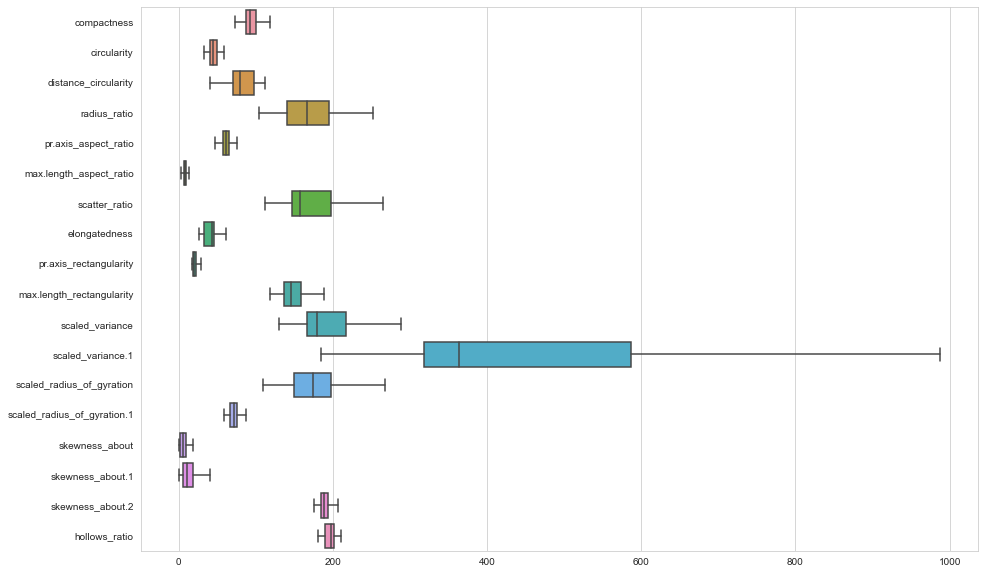

In [29]:
# Check the dataset after Outlier treatment
fig = plt.figure(figsize = (15, 10))
ax = sns.boxplot(data = vehicle_im.iloc[:, 0:18], orient = 'h')

#### Observations
- Instead of removing the outliers, which might have resulted in loss of data, we first replaced the outliers (using IQR method) with nulls and then used SimpleImputer to replace those nulls with median values.
- Again, there's least effect on means and no effect on (ofcourse) median.

## 2. Understanding the attributes - Find relationship between different attributes (Independent variables) and choose carefully which all attributes have to be a part of the analysis and why
### 2.1 Univariate EDA

In [30]:
vehicle_im.skew(axis = 0, skipna = True) 

compactness                    0.381271
circularity                    0.264928
distance_circularity           0.108718
radius_ratio                   0.118680
pr.axis_aspect_ratio           0.161223
max.length_aspect_ratio        0.090367
scatter_ratio                  0.608710
elongatedness                  0.046951
pr.axis_rectangularity         0.774406
max.length_rectangularity      0.256359
scaled_variance                0.602557
scaled_variance.1              0.820685
scaled_radius_of_gyration      0.279910
scaled_radius_of_gyration.1    0.535057
skewness_about                 0.624590
skewness_about.1               0.674715
skewness_about.2               0.249985
hollows_ratio                 -0.226341
class                         -0.537826
dtype: float64

#### Observations
- Distribition of most of the columns show positive skewness (long right tail).
- Distribution of hollows_ratio column shows negative skewness.
- elongatedness, max. length_aspect_ratio columns have approx. symmetric distribution.

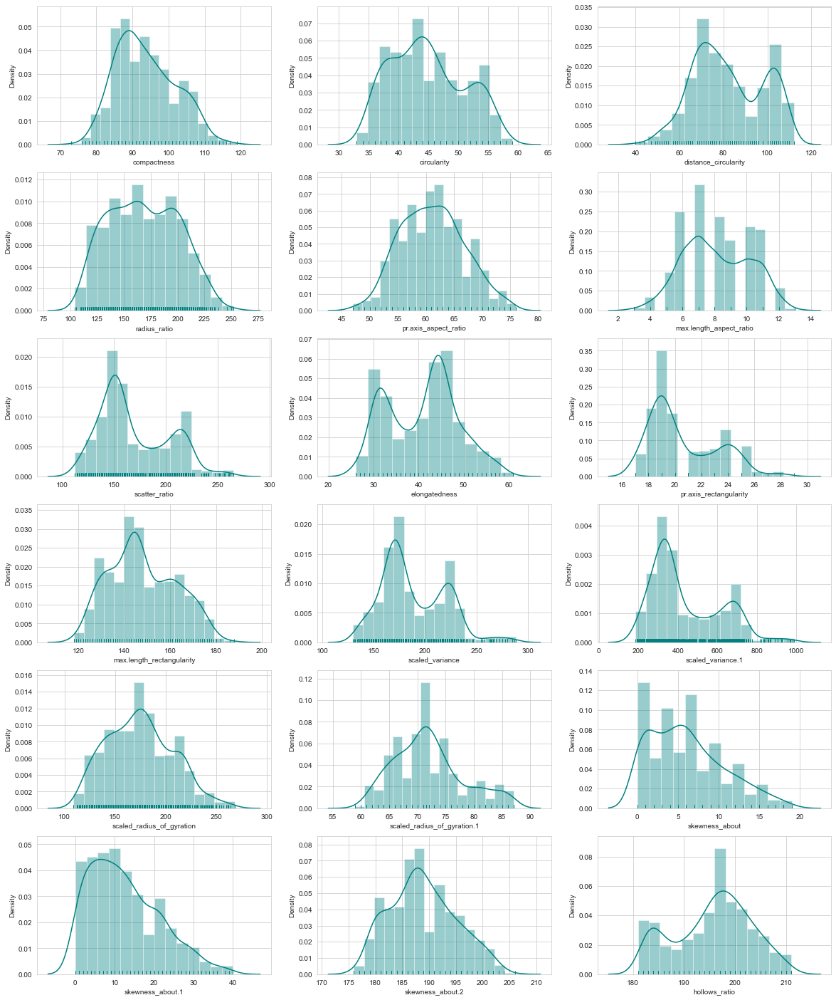

In [31]:
sns.set_style("whitegrid")
plt.figure(figsize=(20,25))
col = 1
for i in vehicle_im.drop(columns = 'class').columns:
    plt.subplot(6, 3, col)
    sns.distplot(vehicle_im[i], color = 'teal', rug = True)
    col += 1

#### Observations
- Columns have data distributed across multiple scales.
- Several columns have distributions that are not unimodal (eg.: distance_circularity, hollows_ratio, elongatedness.
- Column skweness_about, skewness_about.1 have data that is right skewed whereas for column skewness_about.2 data is nearly normally distributed.
- Some columns have long right tail (eg.: pr.axis_aspect_ratio) as evident from the above distplot it is highly likely that they will have outliers.

### 2.2 Bivariate EDA

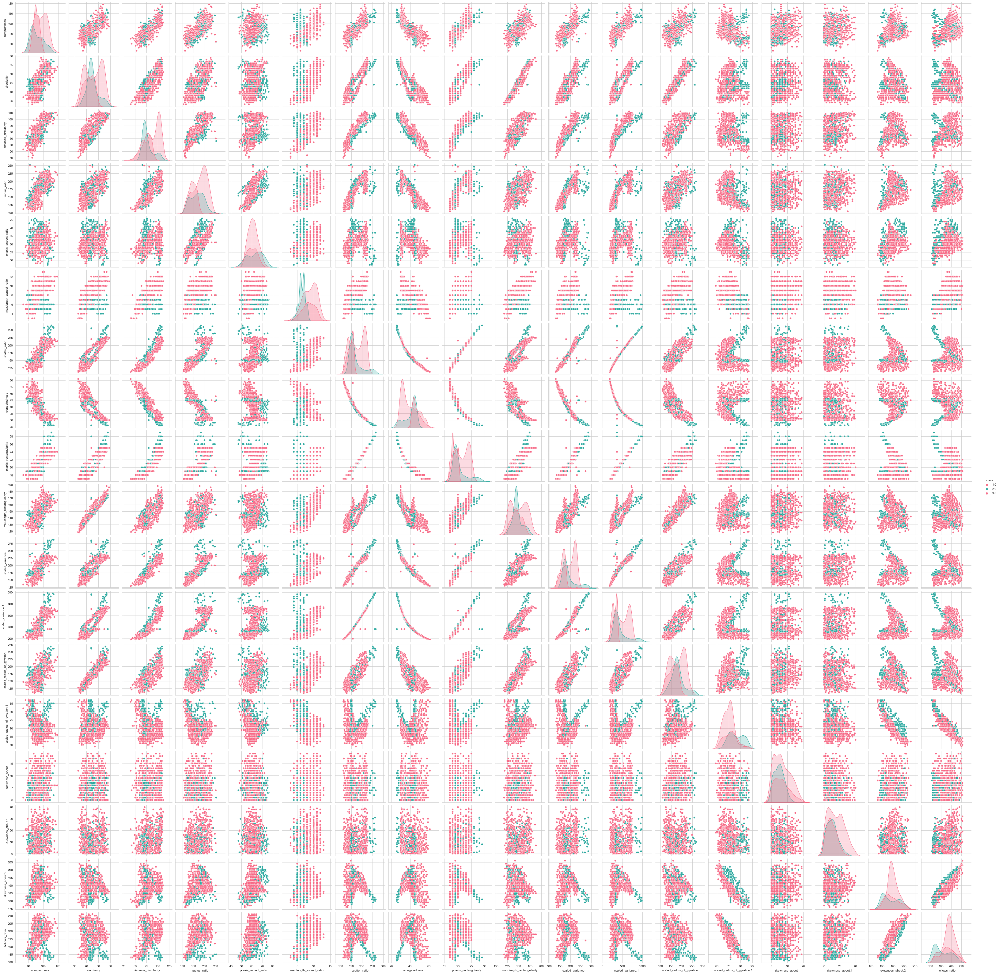

In [32]:
sns.pairplot(vehicle_im, diag_kind = 'kde', hue = 'class',palette="husl")

#### Observatons
- It is clear that, there are many pairs of highly correlated column attributes in the dataset and some of them can be dropped from the dataset to avoid multicolinearity.

In [33]:
cor = vehicle_im.corr()
cor

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
compactness,1.000000,0.684887,0.789928,0.721925,0.192864,0.499928,0.812620,-0.788750,0.813694,0.676143,0.769871,0.806170,0.585243,-0.246681,0.197308,0.156348,0.298537,0.365552,0.297774
circularity,0.684887,1.000000,0.792320,0.638280,0.203253,0.560470,0.847938,-0.821472,0.843400,0.961318,0.802768,0.827462,0.925816,0.068745,0.136351,-0.009666,-0.104426,0.046351,0.251281
distance_circularity,0.789928,0.792320,1.000000,0.794222,0.244332,0.666809,0.905076,-0.911307,0.893025,0.774527,0.869584,0.883943,0.705771,-0.229353,0.099107,0.262345,0.146098,0.332732,0.428523
radius_ratio,0.721925,0.638280,0.794222,1.000000,0.650554,0.463958,0.769941,-0.825392,0.744139,0.579468,0.786183,0.760257,0.550774,-0.390459,0.035755,0.179601,0.405849,0.491758,0.444101
pr.axis_aspect_ratio,0.192864,0.203253,0.244332,0.650554,1.000000,0.150295,0.194195,-0.298144,0.163047,0.147592,0.207101,0.196401,0.148591,-0.321070,-0.056030,-0.021088,0.400882,0.415734,0.062981
max.length_aspect_ratio,0.499928,0.560470,0.666809,0.463958,0.150295,1.000000,0.490759,-0.504181,0.487931,0.642713,0.401391,0.463249,0.397397,-0.335444,0.081898,0.141664,0.083794,0.413174,0.167375
scatter_ratio,0.812620,0.847938,0.905076,0.769941,0.194195,0.490759,1.000000,-0.971601,0.989751,0.809083,0.960883,0.980447,0.799875,0.011314,0.064242,0.211647,0.005628,0.118817,0.463566
elongatedness,-0.788750,-0.821472,-0.911307,-0.825392,-0.298144,-0.504181,-0.971601,1.000000,-0.948996,-0.775854,-0.947644,-0.948851,-0.766314,0.078391,-0.046943,-0.183642,-0.115126,-0.216905,-0.483027
pr.axis_rectangularity,0.813694,0.843400,0.893025,0.744139,0.163047,0.487931,0.989751,-0.948996,1.000000,0.810934,0.947329,0.973606,0.796690,0.027545,0.073127,0.213801,-0.018649,0.099286,0.444586
max.length_rectangularity,0.676143,0.961318,0.774527,0.579468,0.147592,0.642713,0.809083,-0.775854,0.810934,1.000000,0.750222,0.789632,0.866450,0.053856,0.130702,0.004129,-0.103948,0.076770,0.140152


<AxesSubplot:title={'center':'Correlation of Attributes'}>

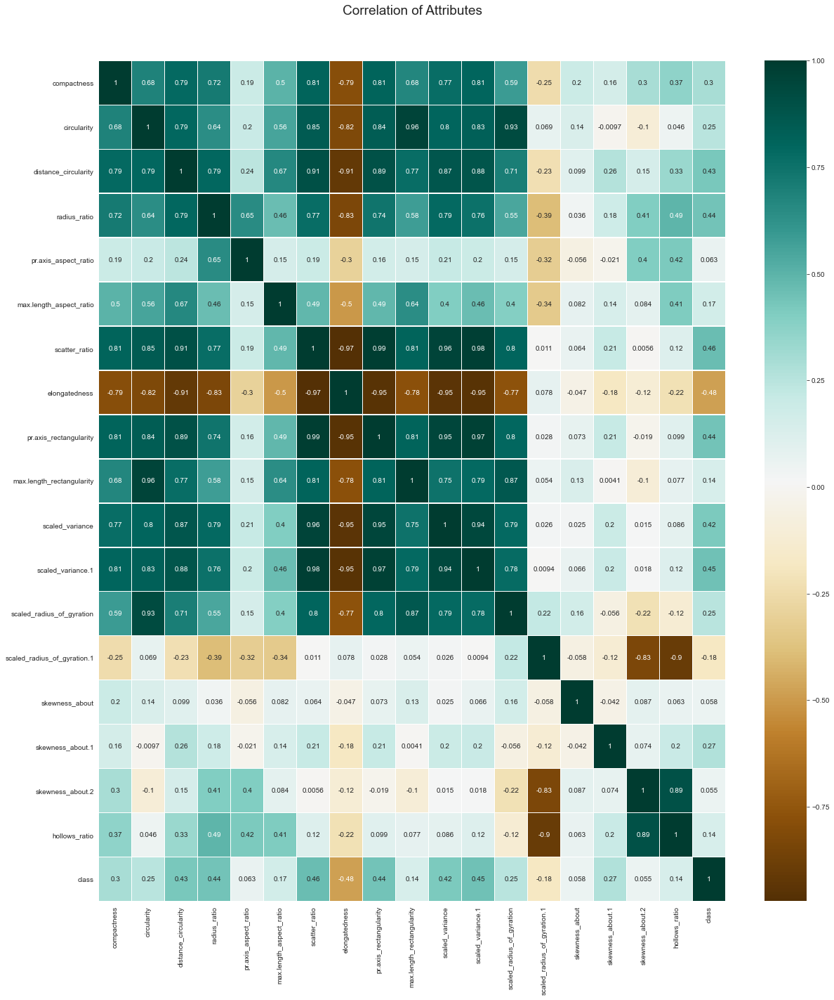

In [34]:
# First, looking correlation between features:

plt.figure(figsize=(20, 22))
plt.title('Correlation of Attributes', y = 1.05, size = 19)
sns.heatmap(cor,annot = True,linewidths = .5,cmap = "BrBG")

#### Observations
- Almost all the scatter plots are rugby shaped, very few scatter plots are of cloud in structure.
- Looking at the heatmap also, the maximum part of it is dark shaded, which means the correlation co-efficient is higher for them.
- This means most of the features are highly co-related with each other either positively or negatively. This explains there is a higher degree of multi-colinearity present in the dataset.
- Only the plots for skewness_about and skewness_about.1 is showing cloud structure across all other features. The heat map for these two features also have all light shades across.
- Hence these 2 features have less colinearity with other features. Let's visualize it through regression plots.

In [35]:
# Let's see the which column pairs have high correlation among themselves?? (>.80)
c = cor.abs() # Since there may be positive as well as -ve correlation
s = c.unstack() # 
so = s.sort_values(ascending=False) # Sorting according to the correlation
so=so[(so<1) & (so>0.8)].drop_duplicates().to_frame() # Due to symmetry.. dropping duplicate entries.
so.columns = ['correlation']
so

correlation
scatter_ratio               pr.axis_rectangularity          0.989751
scaled_variance.1           scatter_ratio                   0.980447
pr.axis_rectangularity      scaled_variance.1               0.973606
scatter_ratio               elongatedness                   0.971601
max.length_rectangularity   circularity                     0.961318
scaled_variance             scatter_ratio                   0.960883
elongatedness               pr.axis_rectangularity          0.948996
                            scaled_variance.1               0.948851
scaled_variance             elongatedness                   0.947644
pr.axis_rectangularity      scaled_variance                 0.947329
scaled_variance             scaled_variance.1               0.943780
circularity                 scaled_radius_of_gyration       0.925816
distance_circularity        elongatedness                   0.911307
scatter_ratio               distance_circularity            0.905076
scaled_radius_of_gyration.1 hollows_ratio                   0.901332
pr.axis_rectangularity      distance_circularity            0.893025
skewness_about.2            hollows_ratio                   0.892581
scaled_variance.1           distance_circularity            0.883943
distance_circularity        scaled_variance                 0.869584
max.length_rectangularity   scaled_radius_of_gyration       0.866450
scatter_ratio               circularity                     0.847938
pr.axis_rectangularity      circularity                     0.843400
skewness_about.2            scaled_radius_of_gyration.1     0.832738
circularity                 scaled_variance.1               0.827462
elongatedness               radius_ratio                    0.825392
                            circularity                     0.821472
pr.axis_rectangularity      compactness                     0.813694
scatter_ratio               compactness                     0.812620
pr.axis_rectangularity      max.length_rectangularity       0.810934
max.length_rectangularity   scatter_ratio                   0.809083
scaled_variance.1           compactness                     0.806170
circularity                 scaled_variance                 0.802768

#### Observations: Following pairs of attributes have very high correlation among them (>=.95)
- scaled_variance.1 & scatter_ratio
- pr.axis_rectangularity & scaled_variance.1
- scatter_ratio & pr.axis_rectangularity
- scatter_ratio & elongatedness
- circularity & max.length_rectangularity
- scaled_variance.1 & elongatedness
- scaled_variance & scatter_ratio
- pr.axis_rectangularity & elongatedness
- scaled_variance & scaled_variance.1

### 2.3 Multivariate Visualization
- Checking relationship between two or more variables. Includes correlation and scatterplot matrix, checking relation between two variables and target variable.

scatter_ratio           pr.axis_rectangularity       0.989751
pr.axis_rectangularity  scatter_ratio                0.989751
scaled_variance.1       scatter_ratio                0.980447
scatter_ratio           scaled_variance.1            0.980447
pr.axis_rectangularity  scaled_variance.1            0.973606
                                                       ...   
scatter_ratio           max.length_rectangularity    0.809083
scaled_variance.1       compactness                  0.806170
compactness             scaled_variance.1            0.806170
circularity             scaled_variance              0.802768
scaled_variance         circularity                  0.802768
Length: 64, dtype: float64

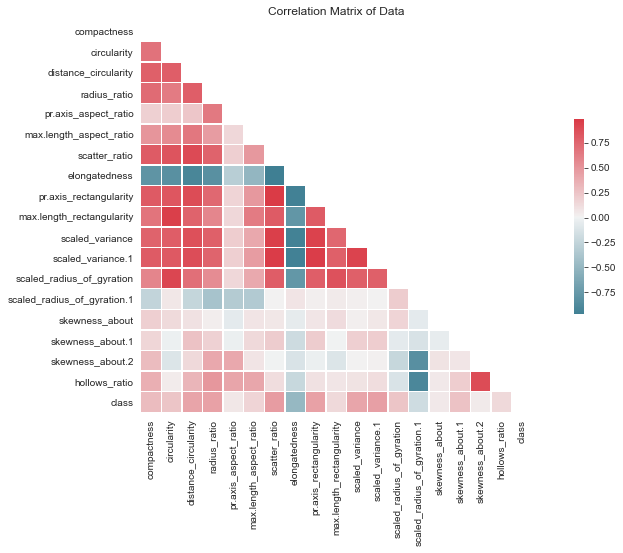

In [36]:
# Correlation matrix for all variables
correlation_matrix(vehicle_im, threshold = 0.8)

In [37]:
absCorrwithDep = []
allVars = vehicle_im.drop('class', axis = 1).columns

for var in allVars:
    absCorrwithDep.append(abs(vehicle_im['class'].corr(vehicle_im[var])))

display(pd.DataFrame([allVars, absCorrwithDep], index = ['Variable', 'Correlation']).T.\
        sort_values('Correlation', ascending = False))

,Variable,Correlation
7,elongatedness,0.483027
6,scatter_ratio,0.463566
11,scaled_variance.1,0.4516
8,pr.axis_rectangularity,0.444586
3,radius_ratio,0.444101
2,distance_circularity,0.428523
10,scaled_variance,0.420329
0,compactness,0.297774
15,skewness_about.1,0.269542
1,circularity,0.251281


#### Observations
- scatter_ratio and pr.axis_rectangularity; scaled_variance.1 and scatter_ratio; pr.axis_rectangularity and scaled_variance.1; pr.axis_rectangularity and scaled_variance.1; elongatedness and scatter_ratio; circularity and max.length_rectangularity; scaled_variance and scatter_ratio; elongatedness and pr.axis_rectangularity; elongatedness and scaled_variance.1; elongatedness and scaled_variance; pr.axis_rectangularity, scaled_variance and scaled_variance.1; distance_circularity and elongatedness; circularity and scaled_radius_of_gyration; distance_circularity and elongatedness; scatter_ratio and distance_circularity are correlated with each other with a correlation coeff greater than 0.9.

- elongatedness, scatter_ratio, scaled_variance.1, pr.axis_rectangularity and radius_ratio are some columns which have relatively strong correlation with the class variable.

- Though multicollinearity exists between columns, some of those have a strong influence on the target variable as well.
- For now lets remove max.length_rectangularity, scaled_variance, scaled_radius_of_gyration, distance_circularity, hollows_ratio and skewness_about.2

In [38]:
vehicle_im.shape

(846, 19)

Let's plot pairplot for columns that have a relatively strong correlation with class variable...

Indeed highly correlated variables ------------------------------------------------------------


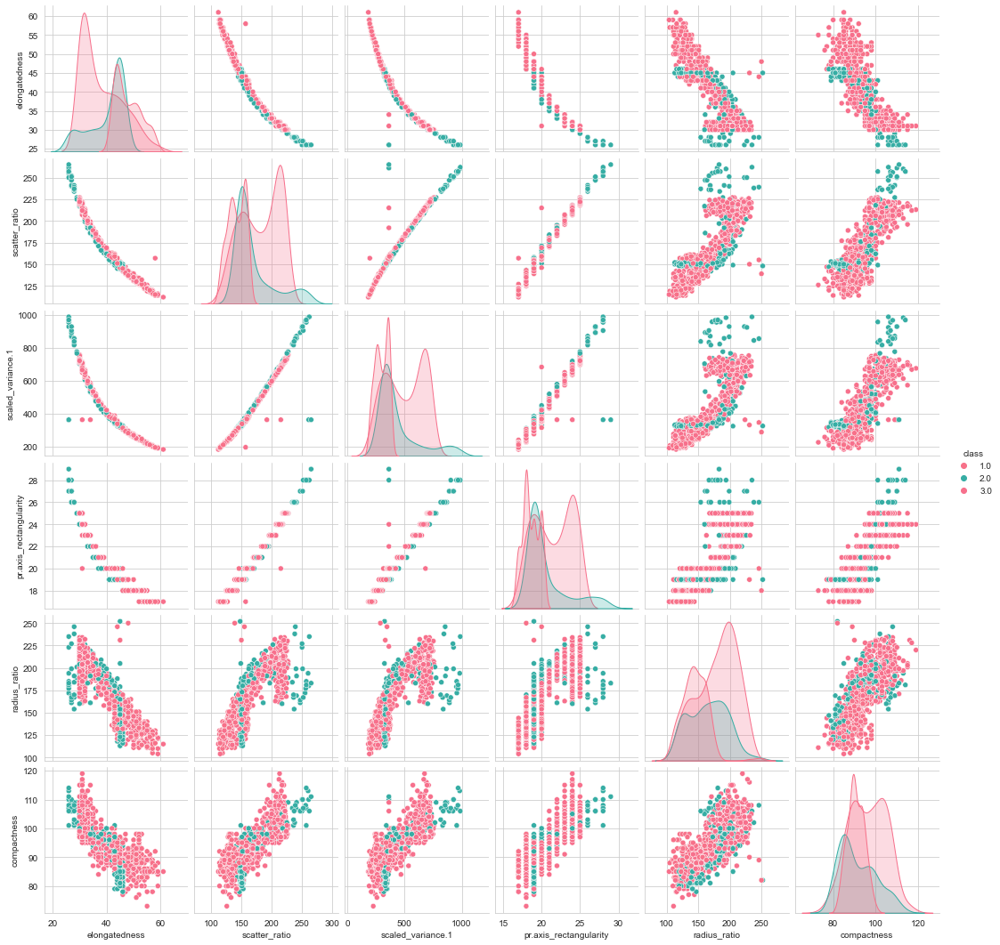

In [39]:
print('Indeed highly correlated variables', '--'*30)
sns.pairplot(vehicle_im[['elongatedness', 'scatter_ratio', 'scaled_variance.1', 
             'pr.axis_rectangularity', 'radius_ratio', 'compactness', 'class']], hue = 'class',palette="husl")

In [40]:
vehicle_im.shape

(846, 19)

In [41]:
# Creating separate variables for features and target
features = vehicle_im.iloc[:, 0:18]; features_list = list(features.columns)
target = vehicle_im['class']

features.shape, target.shape

((846, 18), (846,))

In [42]:
features.head(1)

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
0,95.0,48.0,83.0,178.0,72.0,10.0,162.0,42.0,20.0,159.0,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197.0


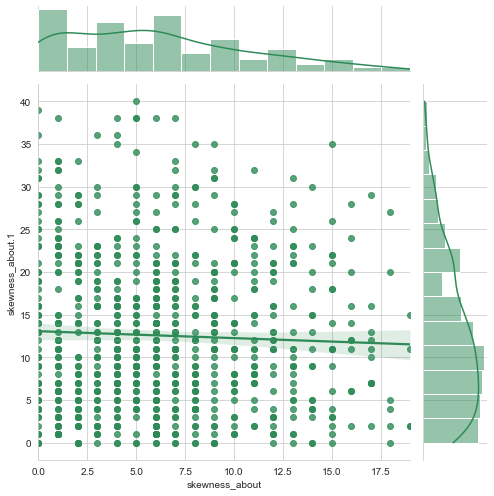

In [43]:
sns.jointplot('skewness_about', 'skewness_about.1', vehicle_im, kind='reg', size=7, color='seagreen')

#### Observations
- The parallel regression line shows these 2 features are not co-related with each other also. So, ideally we should exclude them from PCA analysis.

### 2.4 Undoubtedly, the present dataset is a potential candidate for dimensionality reduction techniques such as PCA, however it will give the reduced number of uncorrelated features in the transformed domain i.e., the new features will be linear combination of some the existing features. Before, applying PCA let us find out which are the important attributes regarding present analysis along with their validation.

Let us start with </b>Univariate feature selection</b> approaches, We will use

- chi2 test
- f_classif
- mututal_info_classif

Then we will also use two more sophisticated approaches:

- RFE
- LASSO

In [44]:
from sklearn.feature_selection import chi2,f_classif,mutual_info_classif,RFE,SelectKBest

#### 2.4.1 Separate independent and target attributes

In [45]:
# For further analysis, let's separate independent and target attributes
y = vehicle_im['class']
X = vehicle_im.drop('class',axis=1)
display(X.shape, y.shape)

(846, 18)

(846,)

#### 2.4.2 Chi square function

In [46]:
# Let us select 10 features using SelectKBest with Chi square function
sel_chi2 = SelectKBest(chi2, k=10) 
X_chi2 = sel_chi2.fit_transform(X, y)

print(sel_chi2.get_support())

[False False  True  True False  True  True  True False False  True  True
  True False  True  True False False]


In [47]:
# Let us see which columns are important according to this test..
feat_chi2 = X.columns[sel_chi2.get_support()].tolist()
feat_chi2

['distance_circularity',
 'radius_ratio',
 'max.length_aspect_ratio',
 'scatter_ratio',
 'elongatedness',
 'scaled_variance',
 'scaled_variance.1',
 'scaled_radius_of_gyration',
 'skewness_about',
 'skewness_about.1']

In [48]:
# Let us see the correlation between these features..
c = vehicle_im[feat_chi2].corr().abs()
s = c.unstack() # 
so = s.sort_values(ascending=False) # Sorting according to the correlation
so=so[(so<1) & (so>0.9)].drop_duplicates().to_frame() # Due to symmetry.. dropping duplicate entries.
so.columns = ['correlation']
so

,,correlation
scaled_variance.1,scatter_ratio,0.980447
elongatedness,scatter_ratio,0.971601
scaled_variance,scatter_ratio,0.960883
scaled_variance.1,elongatedness,0.948851
elongatedness,scaled_variance,0.947644
scaled_variance,scaled_variance.1,0.943780
elongatedness,distance_circularity,0.911307
distance_circularity,scatter_ratio,0.905076


#### Observations
- One can see that between these selected features also, there are 4 pairs of highly correlated (positive or negative) attributes.
- This indicates that use of simple univariate feature selection will not eleminate the problem o multicollinearity and hence overfitting in this case.

#### 2.4.3 f_classif function

In [49]:
# Let us select 10 features usig SelectKBest with f_classif function
sel_fc = SelectKBest(f_classif, k=10) 
X_fc = sel_fc.fit_transform(X, y)
feat_fc = X.columns[sel_fc.get_support()].tolist()
feat_fc

['distance_circularity',
 'radius_ratio',
 'max.length_aspect_ratio',
 'scatter_ratio',
 'elongatedness',
 'pr.axis_rectangularity',
 'scaled_variance',
 'scaled_variance.1',
 'scaled_radius_of_gyration.1',
 'hollows_ratio']

In [50]:
# Let us select 10 features usig SelectKBest with f_classif function
sel_mutual = SelectKBest(mutual_info_classif, k=10)
X_mutual = sel_mutual.fit_transform(X, y)
feat_mutual = X.columns[sel_mutual.get_support()].tolist()
feat_mutual

['circularity',
 'distance_circularity',
 'radius_ratio',
 'max.length_aspect_ratio',
 'scatter_ratio',
 'elongatedness',
 'pr.axis_rectangularity',
 'scaled_variance',
 'scaled_variance.1',
 'scaled_radius_of_gyration']

#### Observations
- The univariate feature selection methods given above doesn't take into consideration the feature interactions among other features and hence they may select a redundant variable which is clear in case of chi2 analysis shown above.

#### 2.4.4 Feature selection using RFE with Logistic regression model

In [51]:
# Let us select 10 features usig SelectKBest using RFE with Logistic regression model
model_logistic = LogisticRegression(solver='lbfgs', multi_class='multinomial', max_iter=1000)
sel_rfe_logistic = RFE(estimator=model_logistic, n_features_to_select=10, step=1)
X_rfe_logistic = sel_rfe_logistic.fit_transform(X, y)
feat_rfe = X.columns[sel_rfe_logistic.get_support()].tolist()
feat_rfe

['compactness',
 'circularity',
 'pr.axis_aspect_ratio',
 'max.length_aspect_ratio',
 'scatter_ratio',
 'elongatedness',
 'pr.axis_rectangularity',
 'max.length_rectangularity',
 'skewness_about.2',
 'hollows_ratio']

In [52]:
# Let us see the correlation between these features..
c = vehicle_im[feat_rfe].corr().abs()
s = c.unstack() # 
so = s.sort_values(ascending=False) # Sorting according to the correlation
so=so[(so<1) & (so>0.9)].drop_duplicates().to_frame() # Due to symmetry.. dropping duplicate entries.
so.columns = ['correlation']
so

,,correlation
scatter_ratio,pr.axis_rectangularity,0.989751
elongatedness,scatter_ratio,0.971601
max.length_rectangularity,circularity,0.961318
elongatedness,pr.axis_rectangularity,0.948996


#### Observations
- RFE aproach seems to provide better features than chi2, since one can see there are only 3 feature pairs which are highly correlated (positive or negative)

In [53]:
# Let us create Dataframe showing all the important (10) features selected by these methods
df_uniFeat = pd.DataFrame({'chi2':feat_chi2,'f_classif':feat_fc,'mutual_info_classif':feat_mutual,'RFE':feat_rfe})
df_uniFeat

,chi2,f_classif,mutual_info_classif,RFE
0,distance_circularity,distance_circularity,circularity,compactness
1,radius_ratio,radius_ratio,distance_circularity,circularity
2,max.length_aspect_ratio,max.length_aspect_ratio,radius_ratio,pr.axis_aspect_ratio
3,scatter_ratio,scatter_ratio,max.length_aspect_ratio,max.length_aspect_ratio
4,elongatedness,elongatedness,scatter_ratio,scatter_ratio
5,scaled_variance,pr.axis_rectangularity,elongatedness,elongatedness
6,scaled_variance.1,scaled_variance,pr.axis_rectangularity,pr.axis_rectangularity
7,scaled_radius_of_gyration,scaled_variance.1,scaled_variance,max.length_rectangularity
8,skewness_about,scaled_radius_of_gyration.1,scaled_variance.1,skewness_about.2
9,skewness_about.1,hollows_ratio,scaled_radius_of_gyration,hollows_ratio


#### 2.4.5 Feature selection using LASSO with Logistic regression model

In [54]:
from sklearn.linear_model import Lasso, LogisticRegression
from sklearn.feature_selection import SelectFromModel
selection = SelectFromModel(LogisticRegression(C=1, penalty='l1', solver='liblinear'),max_features=10)
selection.fit(X,y)
selected_features = X.columns[(selection.get_support())].tolist()
selected_features

['compactness',
 'circularity',
 'pr.axis_aspect_ratio',
 'max.length_aspect_ratio',
 'scatter_ratio',
 'elongatedness',
 'pr.axis_rectangularity',
 'max.length_rectangularity',
 'skewness_about.2',
 'hollows_ratio']

In [55]:
# Adding the LASSO column to the selected features dataframe
df_uniFeat['LASSO'] = selected_features
df_uniFeat

,chi2,f_classif,mutual_info_classif,RFE,LASSO
0,distance_circularity,distance_circularity,circularity,compactness,compactness
1,radius_ratio,radius_ratio,distance_circularity,circularity,circularity
2,max.length_aspect_ratio,max.length_aspect_ratio,radius_ratio,pr.axis_aspect_ratio,pr.axis_aspect_ratio
3,scatter_ratio,scatter_ratio,max.length_aspect_ratio,max.length_aspect_ratio,max.length_aspect_ratio
4,elongatedness,elongatedness,scatter_ratio,scatter_ratio,scatter_ratio
5,scaled_variance,pr.axis_rectangularity,elongatedness,elongatedness,elongatedness
6,scaled_variance.1,scaled_variance,pr.axis_rectangularity,pr.axis_rectangularity,pr.axis_rectangularity
7,scaled_radius_of_gyration,scaled_variance.1,scaled_variance,max.length_rectangularity,max.length_rectangularity
8,skewness_about,scaled_radius_of_gyration.1,scaled_variance.1,skewness_about.2,skewness_about.2
9,skewness_about.1,hollows_ratio,scaled_radius_of_gyration,hollows_ratio,hollows_ratio


#### Observations
- Interestingly, LASSO and RFE methods give the same feature selections.

###### From the above analysis it is clear that, features selected by LASSO (or RFE) have to be the part of the analysis since they are marked as the important features by these methods. Also, for these subset of features we get minimum number of highly correlated (positive or negative) feature pairs (4 in this case).

In [56]:
c = vehicle_im[selected_features].corr().abs()
s = c.unstack() # 
so = s.sort_values(ascending=False) # Sorting according to the correlation
so=so[(so<1) & (so>0.9)].drop_duplicates().to_frame() # Due to symmetry.. dropping duplicate entries.
so.columns = ['correlation']
so

,,correlation
scatter_ratio,pr.axis_rectangularity,0.989751
elongatedness,scatter_ratio,0.971601
max.length_rectangularity,circularity,0.961318
elongatedness,pr.axis_rectangularity,0.948996


In [57]:
# Which are the common features selected by above methods??
fi1 = set(feat_chi2).intersection(set(feat_fc))
fi2 = fi1.intersection(set(feat_mutual))
fi3 = fi2.intersection(set(feat_rfe))
fi3

{'elongatedness', 'max.length_aspect_ratio', 'scatter_ratio'}

#### Observations
- <b>elongatedness</b>, <b>max.length_aspect_ratio</b> and <b>scatter_ratio</b> are the common features selected by the above feature selection methods.

#### 2.4.6 Feature Importance using Random Forest Classifier

<AxesSubplot:title={'center':'Feature Importance'}>

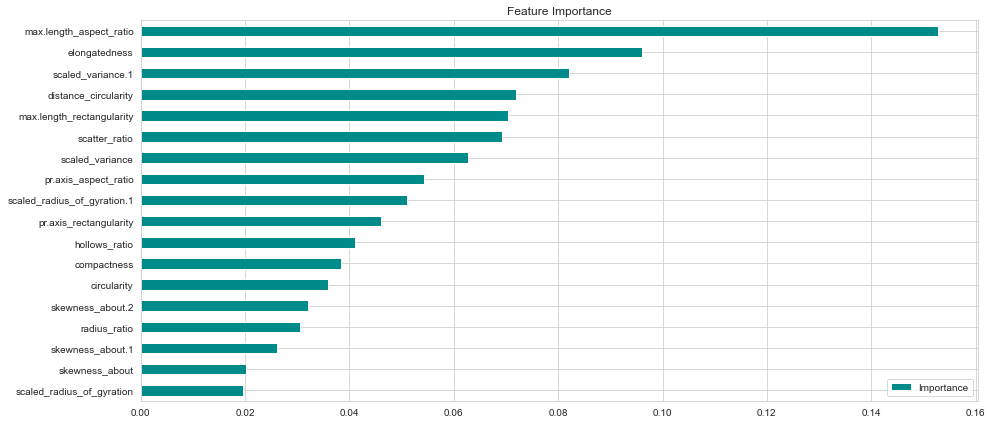

In [58]:
# Feature Importance plot using Random Forest Classifier
rf = RandomForestClassifier().fit(X, y)
pd.DataFrame(rf.feature_importances_, index = vehicle_im.columns[:-1], 
             columns=['Importance']).sort_values('Importance').plot(kind='barh', figsize=(15,7), title='Feature Importance',color='darkcyan')

#### Observations
- From the plot above it is shown that skewness_about and skewness_about.1 are more important than few other features.
- So let's include all the features of the dataset and perform PCA analysis.

### 2.5 Understanding the target variable

In [59]:
# Find count of unique target variable
len(y.unique())

3

In [60]:
# What are the different values for the dependant variable
y.unique()

array([1., 3., 2.])

In [61]:
# Find out the value counts in each outcome category
df_t=vehicle_im['class'].value_counts().to_frame()
df_t.columns=['count'] # renaming the column name
df_t.index.name = 'class' # renaming the index name
df_t['percentage'] = df_t['count']/df_t['count'].sum()*100 # Adding % column
df_t

,count,percentage
class,,
3.0,429,50.709220
2.0,218,25.768322
1.0,199,23.522459


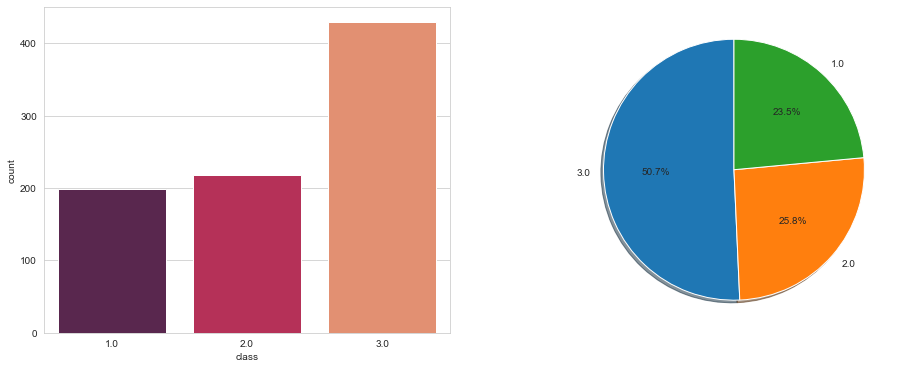

In [62]:
# Check the frequency distribution of each target class
fig, axes = plt.subplots(1, 2, figsize=(16,6))
sns.countplot(y, ax=axes[0], palette='rocket')
_ = axes[1].pie(y.value_counts(), autopct='%1.1f%%', shadow=True, startangle=90, labels=y.value_counts().index)

#### Observations
- The ratio of car to bus to van in the dataset is close to 1:1:2. Of course the car types vehicles includes 2 different types of cars i.e. Saab 9000 and an Opel Manta 400. 
- Hence we can consider this dataset to be almost balanced dataset in terms target classes.

In [63]:
# Compare class wise mean
pd.pivot_table(vehicle_im, index='class', aggfunc=['mean']).T

class                                    1.0         2.0         3.0
mean circularity                   42.070352   44.963303   46.030303
     compactness                   90.562814   91.591743   96.184149
     distance_circularity          73.281407   76.811927   88.878788
     elongatedness                 47.939698   40.114679   38.104895
     hollows_ratio                196.145729  191.325688  197.582751
     max.length_aspect_ratio        8.442211    6.431193    8.825175
     max.length_rectangularity    145.175879  146.701835  149.967366
     pr.axis_aspect_ratio          59.577889   62.912844   60.993007
     pr.axis_rectangularity        18.582915   20.577982   21.508159
     radius_ratio                 144.964824  165.720183  180.496503
     scaled_radius_of_gyration    157.276382  180.963303  179.613054
     scaled_radius_of_gyration.1   71.505025   76.295872   69.935897
     scaled_variance              163.331658  192.889908  197.806527
     scaled_variance.1            298.201005  442.981651  499.904429
     scatter_ratio                141.537688  170.022936  180.997669
     skewness_about                 6.417085    4.816514    6.699301
     skewness_about.1               9.698492   10.211009   15.090909
     skewness_about.2             188.939698  187.811927  189.470862

#### Observations
- There is not much of variation of any features in all the three vehicle types.

## 3. Split the data into train and test (Suggestion: specify “random state” if you are using train_test_split from Sklearn)

In [64]:
vehicle_im["class"].value_counts(normalize=True)

3.0    0.507092
2.0    0.257683
1.0    0.235225
Name: class, dtype: float64

In [65]:
# Let us split the data into 70:30 (train:test) proportion
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.3,random_state = random_state)

In [66]:
# Let us standardize the data
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.fit_transform(X_test)

In [67]:
display(X_train.shape,X_test.shape)

(592, 18)

(254, 18)

## 4. Train a Support Vector Machine using the train set and get the accuracy on the test set 

In [68]:
# Building a Support Vector Machine on train data
svc_model = SVC(kernel = 'linear', gamma = 'scale', C = 1)

print('SVC Model of dataset without PCA')

# fitting the model
svc_model.fit(X_train, y_train)

# predict the response
svm_y_predict = svc_model.predict(X_test)

# evaluate accuracy
svm_score = svc_model.score(X_train, y_train)
svm_accuracy = accuracy_score(y_test, svm_y_predict)   #Accuracy of SVM model
svm_confusion_matrix = metrics.confusion_matrix(y_test, svm_y_predict)

SVC Model of dataset without PCA


In [69]:
# check the accuracy on the training set
print('Accuracy of Training Data : {:.2f} %'.format(svm_score *100))
print('Accuracy of Testing Data  : {:.2f} %'.format(svm_accuracy*100))

Accuracy of Training Data : 97.64 %
Accuracy of Testing Data  : 93.31 %



 Confusion Matrix - SVM Classifier Model, Without Normalization 

[[ 53   1   4]
 [  1  74   3]
 [  3   5 110]]


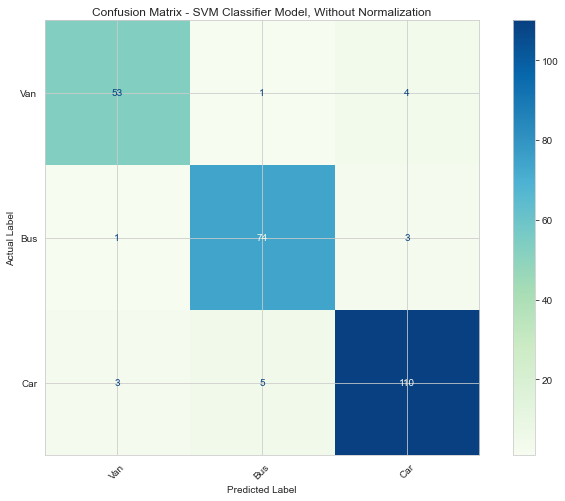

In [70]:
classNames = ['Van','Bus','Car']
labels, counts = np.unique(y, return_counts=True)
#plt.title("Confusion Matrix - SVM Classifier Model")

from sklearn.metrics import plot_confusion_matrix

np.set_printoptions(precision=2)

# Plot non-normalized & normalized confusion matrix
titles_options = [("Confusion Matrix - SVM Classifier Model, Without Normalization", None)]
                  #("Confusion Matrix - SVM Classifier Model, With Normalization", 'true')]

for title, normalize in titles_options:
    fig, ax = plt.subplots(figsize=(12,8))
    disp = plot_confusion_matrix(svc_model, X_test, y_test,
                                 display_labels=classNames,
                                 cmap="GnBu",ax=ax,
                                 normalize=normalize)
    plt.ylabel("Actual Label")
    plt.xlabel("Predicted Label")
    
    tick_marks = np.arange(len(classNames))
    plt.xticks(tick_marks, classNames, rotation=45)
    plt.yticks(tick_marks, classNames)
    
    disp.ax_.set_title(title)

    print("\n",title,"\n")
    print(disp.confusion_matrix)

plt.show()

In [71]:
print('-------------Final Analysis of SVM without PCA-------------------\n')
print('\nSVM Model Accuracy Score without PCA : {:.2f} %'.format(accuracy_score(y_test, svm_y_predict)*100))
print('Mean Absolute Error of SVM without PCA : {:.2f}'.format(mean_absolute_error(y_test, svm_y_predict)))

precision, recall, f1_score, support = precision_recall_fscore_support(y_test, svm_y_predict, average = 'macro')
print('\nPrecision Score :', '%0.2f' % precision)
print('Recall Score    :', '%0.2f' % recall)
print('F1-Score        :', '%0.2f' % f1_score)
print('Accuracy Score  :','%0.2f ' % svm_accuracy)

print('\nSVM Classification Report Without PCA : \n',classification_report(y_test, svm_y_predict, target_names=['Van', 'Bus', 'Car']))

-------------Final Analysis of SVM without PCA-------------------


SVM Model Accuracy Score without PCA : 93.31 %
Mean Absolute Error of SVM without PCA : 0.09

Precision Score : 0.93
Recall Score    : 0.93
F1-Score        : 0.93
Accuracy Score  : 0.93 

SVM Classification Report Without PCA : 
               precision    recall  f1-score   support

         Van       0.93      0.91      0.92        58
         Bus       0.93      0.95      0.94        78
         Car       0.94      0.93      0.94       118

    accuracy                           0.93       254
   macro avg       0.93      0.93      0.93       254
weighted avg       0.93      0.93      0.93       254



## 5. Perform K-fold cross validation and get the cross validation score of the model

In [72]:
from sklearn.model_selection import KFold, cross_val_score

In [73]:
splits = 10 # Number of splits
kfold = KFold(n_splits = splits,random_state = 2020)
scores = cross_val_score(SVC(),X_train_scaled,y_train, cv = kfold)

print("Cross validation scores for {}-fold split are: \n {} ".format(splits,scores))

print("\nAverage cross validation score is {:.2f} % with (std: {:.2f})".format(scores.mean()*100,scores.std()*100))

Cross validation scores for 10-fold split are: 
 [0.97 0.97 0.95 0.92 0.98 0.92 0.93 0.93 0.95 0.97] 

Average cross validation score is 94.76 % with (std: 2.21)


## 6. Use PCA from Scikit learn, extract Principal Components that capture about 95% of the variance in the data

#### Curse of Dimensionality
Curse of dimensionality is the phenomenon where the feature space becomes increasingly sparse for an increasing number of dimensions of a fixed-size training dataset. Analyzing and organizing the data in a high-dimensional spaces (often with hundreds or thousands of dimensions) are always prone to various adverse outcomes. Most of the machine learning algorithms are very susceptible to overfitting due to the curse of dimensionality.

To overcome such situations, we do feature engineering where algorithms run their logic to reduce the higher no. of dimensions. PCA is one such feature extraction technique.

#### Principal Component Analysis (PCA)
Principal Component Analysis (PCA) uses "orthogonal linear transformation" to introduces a lower-dimensional representation of the dataset. It finds a sequence of linear combination of the variables called the principal components that explain the maximum variance and summarize the most information in the data and are mutually uncorrelated with each other.

PCA allows us to quantify the trade-offs between the number of features we utilize and the total variance explained by the data. PCA allows us to determine which features capture similiar information and discard them to create a more parsimonious model.

In order to perform PCA we need to do the following:
1. Standardize the data.
2. Use the standardized data to create a covariance matrix.
3. Use the resulting matrix to calculate eigenvectors (principal components) and their corresponding eigenvalues.
4. Sort the components in decending order by its eigenvalue.
5. Choose n components which explain the most variance within the data (larger eigenvalue means the feature explains more variance).
6. Create a new matrix using the n components.

### 6.1 PCA Steps

In [74]:
X_col = X.columns
scaler = RobustScaler()
X_train1 = pd.DataFrame(scaler.fit_transform(X))
X_train1.columns = X_col #the column names are passed to the standardized dataframe
X_train1.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
0,0.153846,0.444444,0.107143,0.204651,1.375,0.666667,0.098039,-0.076923,0.00,0.590909,-0.060302,0.057890,0.214286,-0.1875,0.000000,0.357143,-0.111111,0.000000
1,-0.153846,-0.333333,0.142857,-0.483721,-0.500,0.333333,-0.156863,0.153846,-0.25,-0.136364,-0.180905,-0.125117,-0.316327,0.0625,0.428571,0.214286,0.111111,0.186047
2,0.846154,0.666667,0.928571,0.781395,0.625,0.666667,0.980392,-0.846154,0.75,0.545455,0.884422,1.014006,0.948980,0.1875,1.142857,-0.142857,0.000000,-0.093023
3,0.000000,-0.333333,0.071429,-0.148837,0.250,0.333333,-0.254902,0.230769,-0.25,-0.136364,-0.381910,-0.203548,-0.948980,-1.0625,0.000000,-0.071429,1.222222,0.930233
4,-0.615385,0.000000,-0.357143,0.706977,0.000,0.000000,-0.156863,0.153846,-0.25,-0.090909,1.246231,-0.143791,0.295918,0.0000,0.428571,0.000000,-0.888889,-1.302326


In [75]:
# Let is create PCA transformation object
pca_obj = PCA()
X_pca = pca_obj.fit_transform(X_train1)
# X_pca is a n-dim numpy array, let's convert it into dataframe
df_pca = pd.DataFrame(X_pca,columns=['PrincipalComp-'+str(x) for x in range(1,X.shape[1]+1)])
df_pca.head()

,PrincipalComp-1,PrincipalComp-2,PrincipalComp-3,PrincipalComp-4,PrincipalComp-5,PrincipalComp-6,PrincipalComp-7,PrincipalComp-8,PrincipalComp-9,PrincipalComp-10,PrincipalComp-11,PrincipalComp-12,PrincipalComp-13,PrincipalComp-14,PrincipalComp-15,PrincipalComp-16,PrincipalComp-17,PrincipalComp-18
0,0.446376,-0.475441,0.415578,-0.591180,-0.628784,-1.166228,-0.141708,-0.343759,0.334776,0.120027,-0.098800,-0.086754,-0.131601,0.055718,0.126825,-0.018453,0.039849,0.007081
1,-0.969205,-0.247348,-0.860688,0.132533,-0.118024,-0.153620,0.121625,-0.028565,-0.251388,-0.186859,-0.077036,-0.222624,0.117686,-0.022479,0.084374,-0.046822,0.028318,-0.004966
2,2.471311,0.202940,-0.292011,-0.761633,0.598456,-0.485311,0.517424,0.137581,0.059605,-0.341580,-0.096848,-0.115447,0.050776,-0.090985,-0.024627,-0.037189,0.062682,0.063094
3,-0.945422,-2.161404,-0.350315,-0.148290,-0.333014,0.219506,0.096389,-0.207973,-0.212381,0.259560,-0.007382,-0.241367,-0.026767,-0.054363,0.024125,0.071766,-0.102786,-0.027323
4,-0.440204,1.005528,0.217450,-0.347911,0.147644,-0.579934,0.214694,1.081624,0.766720,-0.282094,1.187054,0.450055,-0.101423,-0.136447,0.386330,-0.179160,-0.132181,-0.070660


In [76]:
# Covariance matrix
covar_matrix = PCA(n_components = X_train1.shape[1])
print('Covariance Matrix \n%s', covar_matrix)

Covariance Matrix 
%s PCA(n_components=18)


In [77]:
covar_matrix.fit(X_train1)

# calculate variance ratios
var = covar_matrix.explained_variance_ratio_;var

array([5.10e-01, 2.14e-01, 6.61e-02, 6.37e-02, 5.07e-02, 3.82e-02,
       1.80e-02, 1.24e-02, 7.91e-03, 4.57e-03, 3.72e-03, 2.97e-03,
       2.23e-03, 1.70e-03, 1.56e-03, 1.22e-03, 1.09e-03, 2.77e-04])

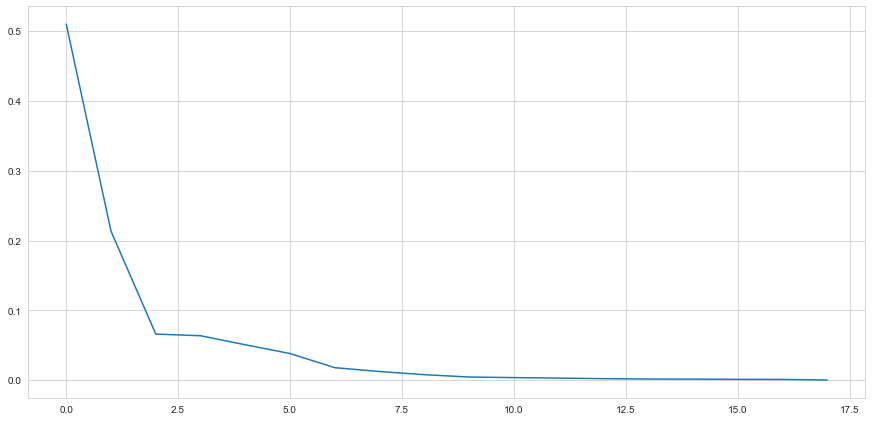

In [78]:
plt.figure(figsize = (15 , 7.2))
plt.plot(var)

In [79]:
def generate_scree_plot(covar_matrix, threshold):
    var = covar_matrix.explained_variance_
    eigen_vals = np.cumsum(np.round(covar_matrix.explained_variance_ratio_, decimals=3)*100)

    f, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20,7))
    f.suptitle('PCA Scree plot')

    ax1.plot(np.arange(1, len(var)+1), var, '-go')
    ax1.set_xticks(np.arange(1, len(var)+1))
    ax1.set_title('Explained Variance')
    ax1.set_xlabel('Principle Components')
    ax1.set_ylabel('Eigen Values')

    ax2.plot(np.arange(1, len(eigen_vals)+1), eigen_vals, ':k', marker='o', markerfacecolor='red', markersize=8)
    ax2.set_xticks(np.arange(1, len(eigen_vals)+1))
    ax2.axhline(y=threshold, color='r', linestyle=':', label='Threshold(95%)')
    ax2.legend()
    ax2.plot(np.arange(sum(eigen_vals <= threshold) + 1, len(eigen_vals) + 1), 
             [val for val in eigen_vals if val > threshold], '-bo')
    ax2.set_ylim(bottom=threshold-10, top=100)
    ax2.set_xlim(right=11)
    ax2.set_title('Cumulative sum Explained Variance Ratio')
    ax2.set_xlabel('Principle Components')
    ax2.set_ylabel('% Variance Explained')

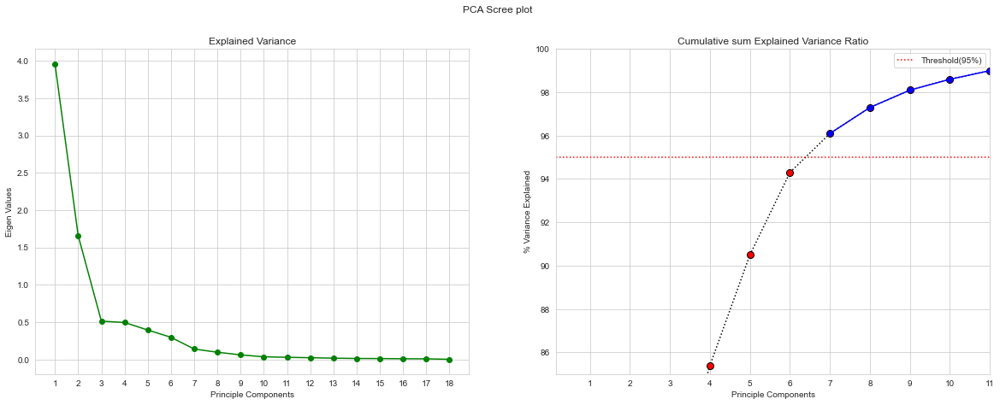

In [80]:
generate_scree_plot(covar_matrix, threshold=95)

#### Observations
- Scree plot and Cumulative Eigen value plot shows that, post PCA, employing 6 principal components we are able to explain more than 95% of the variance in the dataset.
- Hence we will be reducing our feature space to 6 dimensions without loosing much of information.

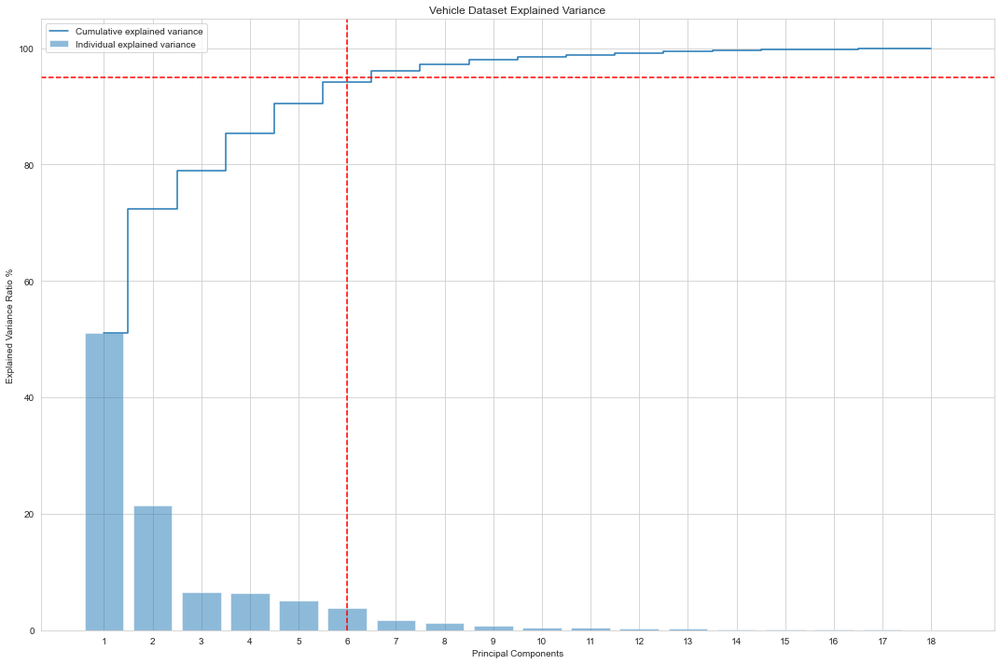

In [81]:
# Let's see how much variance is explained by each principal components in percentage
var_exp = pca_obj.explained_variance_ratio_*100
cum_var_exp = np.cumsum(var_exp)
x = range(1, X.shape[1] + 1)
plt.figure(figsize=(15,10))
plt.bar(x, var_exp, alpha = 0.5, align = 'center', label = 'Individual explained variance')
plt.step(x, cum_var_exp, where='mid', label = 'Cumulative explained variance')
plt.axhline(y = 95, color = 'r', linestyle = '--')
plt.axvline(x = 6, color = 'r', linestyle = '--')
plt.ylabel('Explained Variance Ratio %')
plt.xlabel('Principal Components')
plt.xticks(x, [str(i) for i in x])
plt.legend(loc = 'best')
plt.title('Vehicle Dataset Explained Variance')
plt.tight_layout()

In [82]:
cum_var_exp

array([ 51.  ,  72.36,  78.97,  85.34,  90.41,  94.23,  96.03,  97.27,
        98.07,  98.52,  98.89,  99.19,  99.41,  99.58,  99.74,  99.86,
        99.97, 100.  ])

#### Observations
- In the above array we see that the <b>first feature explains roughly 54%</b> of the variance within our data set while the first two explain 72.3% and so on.
- If we employ 6 features we capture 96.3% (threshold = 95%) of the variance within the dataset, thus we gain very little by implementing an additional feature (think of this as diminishing marginal return on total variance explained).

#### Applying PCA on 6 Components

In [83]:
pca_6 = PCA(n_components = 6, random_state = random_state)
X_pca = pca_6.fit_transform(X_train1)

print('Original number of features :',X_train1.shape[1])
print('Reduced number of features  :',X_pca.shape[1])

Original number of features : 18
Reduced number of features  : 6


In [84]:
pca_6.components_

array([[ 0.27,  0.31,  0.27,  0.25,  0.11,  0.21,  0.32, -0.29,  0.31,
         0.29,  0.29,  0.31,  0.28, -0.05,  0.04,  0.06,  0.04,  0.09],
       [-0.07,  0.13, -0.03, -0.16, -0.25, -0.11,  0.07, -0.02,  0.08,
         0.11,  0.07,  0.07,  0.2 ,  0.56, -0.02, -0.08, -0.49, -0.5 ],
       [-0.12, -0.06, -0.06,  0.25,  0.61, -0.37,  0.05, -0.09,  0.02,
        -0.14,  0.12,  0.06, -0.01,  0.17, -0.57, -0.06,  0.02, -0.1 ],
       [ 0.04, -0.2 ,  0.1 , -0.04, -0.36, -0.02,  0.12, -0.07,  0.12,
        -0.18,  0.12,  0.12, -0.23, -0.  , -0.36,  0.74, -0.05,  0.02],
       [ 0.17, -0.13, -0.05,  0.09,  0.03, -0.61,  0.09, -0.07,  0.09,
        -0.23,  0.14,  0.12, -0.01,  0.11,  0.61,  0.15,  0.22, -0.08],
       [ 0.21, -0.02, -0.02, -0.1 , -0.53, -0.31,  0.09, -0.07,  0.09,
        -0.04,  0.12,  0.1 , -0.01, -0.14, -0.37, -0.54,  0.27,  0.04]])

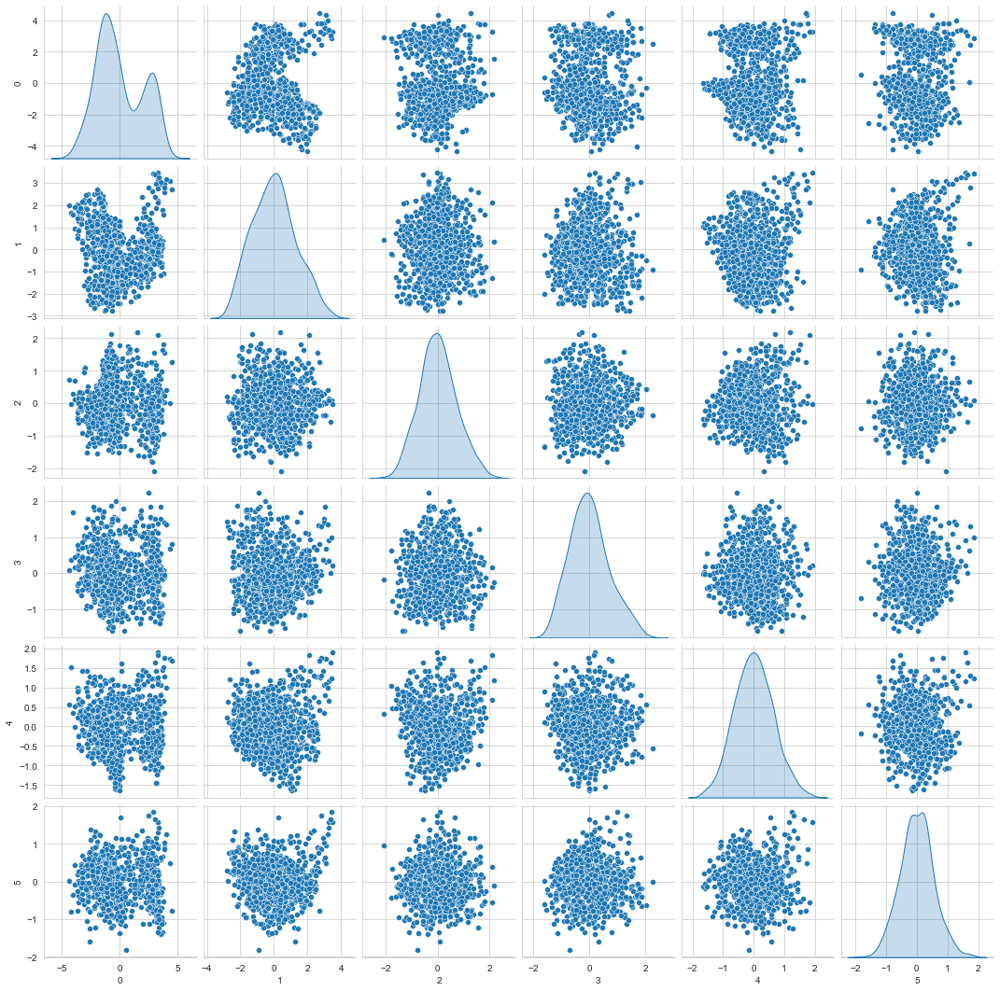

In [85]:
# Pairplot after dimension reduction
sns.pairplot(pd.DataFrame(X_pca), diag_kind = 'kde',palette="husl")

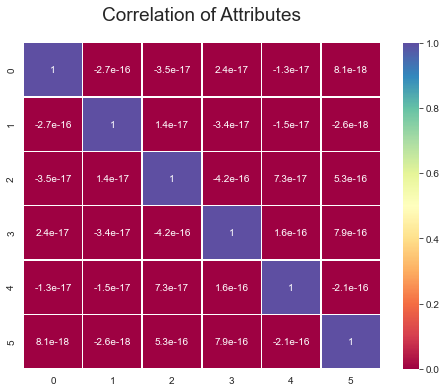

In [86]:
plt.figure(figsize=(8,6))
plt.title('Correlation of Attributes', y = 1.05, size = 19)
sns.heatmap(pd.DataFrame(X_pca).corr(),annot=True,linewidths = .5,cmap = 'Spectral');

## 7. Repeat steps 3,4 and 5 but this time, use Principal Components instead of the original data. And the accuracy score should be on the same rows of test data that were used earlier.

### 7.1 Splitting the data into training (70%) and testing set (30%).

Original Dataset

In [87]:
X_train_1, X_test_1, y_train_1, y_test_1 = train_test_split(X_train1, y, test_size = 0.3, random_state = 10)

In [88]:
rtr, ctr = X_train.shape
print('The training set comprises of', rtr, 'rows and', ctr, 'columns.')

The training set comprises of 592 rows and 18 columns.


In [89]:
rt, ct = X_test.shape
print('The test set comprises of', rt, 'rows and', ct, 'columns.')

The test set comprises of 254 rows and 18 columns.


PCA reduced Dataset

In [90]:
X_tr, X_te, y_tr, y_te = train_test_split(X_pca, y, test_size = 0.3, random_state = 10)

In [91]:
rtr_pca, ctr_pca = X_tr.shape
print('The PCA training set comprises of', rtr_pca, 'rows and', ctr_pca, 'columns.')

The PCA training set comprises of 592 rows and 6 columns.


In [92]:
rt_pca, ct_pca = X_te.shape
print('The PCA test set comprises of', rt_pca, 'rows and', ct_pca, 'columns.')

The PCA test set comprises of 254 rows and 6 columns.


### 7.2 SVM with PCA

In [93]:
# Building a Support Vector Machine on train data
svc_model_pca = SVC(kernel = 'linear', gamma = 'scale', C = 1)

print('SVC Model of dataset with PCA')

# fitting the model
svc_model_pca.fit(X_tr, y_tr)

# predict the response
svm_y_predict_pca = svc_model_pca.predict(X_te)

# evaluate accuracy
svm_score_pca = svc_model_pca.score(X_tr, y_tr)
svm_accuracy_pca = accuracy_score(y_te, svm_y_predict_pca)   #Accuracy of SVM model
svm_confusion_matrix = metrics.confusion_matrix(y_te, svm_y_predict_pca)

SVC Model of dataset with PCA


In [94]:
# check the accuracy on the training set
print('Accuracy of Training Data : {:.2f} %'.format(svm_score_pca*100))
print('Accuracy of Testing Data  : {:.2f} %'.format(svm_accuracy_pca*100))

Accuracy of Training Data : 81.42 %
Accuracy of Testing Data  : 85.83 %



 Confusion Matrix - SVM Classifier Model, Without Normalization 

[[ 53   4   1]
 [  4  59   8]
 [ 11   8 106]]


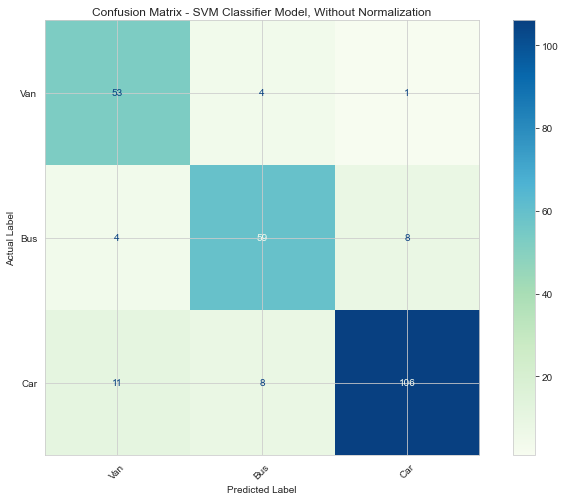

In [95]:
classNames = ['Van','Bus','Car']
labels, counts = np.unique(y, return_counts=True)
#plt.title("Confusion Matrix - SVM Classifier Model")

from sklearn.metrics import plot_confusion_matrix

np.set_printoptions(precision=2)

# Plot non-normalized & normalized confusion matrix
titles_options = [("Confusion Matrix - SVM Classifier Model, Without Normalization", None)]
                  
for title, normalize in titles_options:
    fig, ax = plt.subplots(figsize=(12,8))
    disp = plot_confusion_matrix(svc_model_pca, X_te, y_te,
                                 display_labels=classNames,
                                 cmap="GnBu",ax=ax,
                                 normalize=normalize)
    plt.ylabel("Actual Label")
    plt.xlabel("Predicted Label")
    
    tick_marks = np.arange(len(classNames))
    plt.xticks(tick_marks, classNames, rotation=45)
    plt.yticks(tick_marks, classNames)
    
    disp.ax_.set_title(title)

    print("\n",title,"\n")
    print(disp.confusion_matrix)

plt.show()

In [96]:
print('-------------Final Analysis of SVM wih PCA-------------------\n')
print('\nSVM Model Accuracy Score with PCA : {:.2f} %'.format((svm_accuracy_pca*100)))
print('Mean Absolute Error of SVM with PCA : {:.2f}'.format(mean_absolute_error(y_te, svm_y_predict_pca)))

precision_pca, recall_pca, f1_score_pca, support = precision_recall_fscore_support(y_te, svm_y_predict_pca, average = 'macro')
print('\nPrecision Score :', '%0.2f' % precision_pca)
print('Recall Score    :', '%0.2f' % recall_pca)
print('F1-Score        :', '%0.2f' % f1_score_pca)
print('Accuracy Score  :','%0.2f ' % svm_accuracy_pca)

print('\nSVM Classification Report Wih PCA : \n',classification_report(y_te, svm_y_predict_pca, target_names=['Van', 'Bus', 'Car']))

-------------Final Analysis of SVM wih PCA-------------------


SVM Model Accuracy Score with PCA : 85.83 %
Mean Absolute Error of SVM with PCA : 0.19

Precision Score : 0.84
Recall Score    : 0.86
F1-Score        : 0.85
Accuracy Score  : 0.86 

SVM Classification Report Wih PCA : 
               precision    recall  f1-score   support

         Van       0.78      0.91      0.84        58
         Bus       0.83      0.83      0.83        71
         Car       0.92      0.85      0.88       125

    accuracy                           0.86       254
   macro avg       0.84      0.86      0.85       254
weighted avg       0.86      0.86      0.86       254



#### Dataframe showing results of models with and without PCA

In [97]:
mdllists = []
mdllists.append(['Support Vector Classifier with PCA', svm_score_pca * 100, svm_accuracy_pca * 100, recall_pca * 100, precision_pca * 100])
mdllists.append(['Support Vector Classifier without PCA', svm_score * 100, svm_accuracy * 100, recall * 100, precision * 100])
mdl_df = pd.DataFrame(mdllists, columns = ['Model', 'Accuracy Score of Training Data', 'Accuracy Score of Test Data', 'Recall Score', 'Precision Score'])
mdl_df

,Model,Accuracy Score of Training Data,Accuracy Score of Test Data,Recall Score,Precision Score
0,Support Vector Classifier with PCA,81.418919,85.826772,86.425967,84.404560
1,Support Vector Classifier without PCA,97.635135,93.307087,93.157148,93.166517


#### Observations
- We can see that the accuracy score of Test Data has reduced with PCA by about 16.22 %.

### 7.3 Use grid search (try C values - 0.01, 0.05, 0.5, 1 and kernel = linear, rbf) and find out the best hyper parameters and do cross validation to find the accuracy.

#### 7.3.1 Grid Search with PCA dataset

In [98]:
param_grid_pca = [{'kernel': ['rbf'], 'C': [0.01, 0.05, 0.5, 1]},
                    {'kernel': ['linear'], 'C': [0.01, 0.05, 0.5, 1]}]


# Make grid search classifier
clf_grid_pca = GridSearchCV(SVC(), param_grid_pca, verbose = 1)
 
# Train the classifier
clf_grid_pca.fit(X_tr, y_tr)
 

print('\nBest Parameters :',clf_grid_pca.best_params_)
print('\nBest Estimators :',clf_grid_pca.best_estimator_)

Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.



Best Parameters : {'C': 1, 'kernel': 'rbf'}

Best Estimators : SVC(C=1)


[Parallel(n_jobs=1)]: Done  40 out of  40 | elapsed:    0.3s finished


#### Observations
- According to Grid Search, the RBF model of SVC with C (regularization parameter) as 1.
- Use the SVC parameter as suggested by Grid Search.

In [99]:
# Building a SVM Classifier on train data
svc = SVC(kernel = 'rbf', gamma = 'scale', C = 1)

skf = StratifiedKFold(n_splits = 10, random_state = random_state)
grid_svc = GridSearchCV(svc, param_grid = param_grid_pca, n_jobs = -1, cv = skf)
# fitting the model
grid_svc.fit(X_tr, y_tr)

print('\nSVM Scores with Hyperparameter Tuning\n')
print('Best Hyper Parameters are :',grid_svc.best_params_)
print('            Best Score is :',grid_svc.best_score_.round(3))

# predict the response
svm_y_predict_pca_grid = grid_svc.predict(X_te)

# Cross Validation Score
grid_svc_pca_score = cross_val_score(grid_svc, X_tr, y_tr, cv = skf)
print('SVM Cross Validation Training Score :',round(grid_svc_pca_score.mean(), 3).astype(str))

# evaluate accuracy
svm_score_pca_grid = grid_svc.score(X_tr, y_tr)
svm_accuracy_pca_grid = accuracy_score(y_te, svm_y_predict_pca_grid ) # Accuracy of SVC Classifier model
svm_confusion_matrix_pca_grid = metrics.confusion_matrix(y_te, svm_y_predict_pca_grid )


SVM Scores with Hyperparameter Tuning

Best Hyper Parameters are : {'C': 1, 'kernel': 'rbf'}
            Best Score is : 0.912
SVM Cross Validation Training Score : 0.912


In [100]:
# check the accuracy on the training set
print('Accuracy of Training Data : {:.2f} %'.format(svm_score_pca_grid*100))
print('Accuracy of Testing Data  : {:.2f} %'.format(svm_accuracy_pca_grid*100))

Accuracy of Training Data : 92.40 %
Accuracy of Testing Data  : 91.34 %



 Confusion Matrix - SVM Classifier Model, Without Normalization 

[[ 50   0   8]
 [  0  68   3]
 [ 10   1 114]]


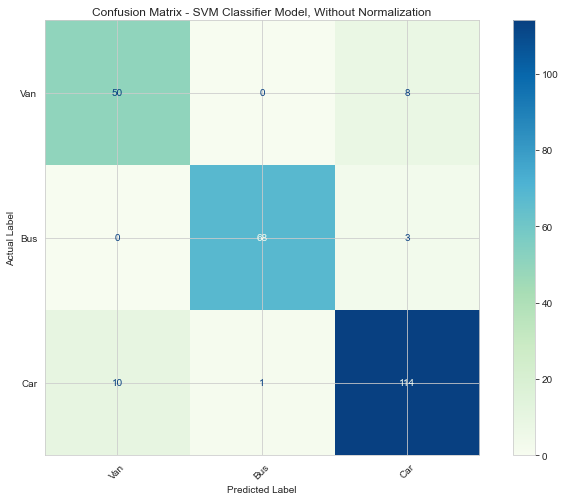

In [101]:
classNames = ['Van','Bus','Car']
labels, counts = np.unique(y, return_counts=True)
#plt.title("Confusion Matrix - SVM Classifier Model")

from sklearn.metrics import plot_confusion_matrix

np.set_printoptions(precision=2)

# Plot non-normalized & normalized confusion matrix
titles_options = [("Confusion Matrix - SVM Classifier Model, Without Normalization", None)]
                  
for title, normalize in titles_options:
    fig, ax = plt.subplots(figsize=(12,8))
    disp = plot_confusion_matrix(grid_svc, X_te, y_te,
                                 display_labels=classNames,
                                 cmap="GnBu",ax=ax,
                                 normalize=normalize)
    plt.ylabel("Actual Label")
    plt.xlabel("Predicted Label")
    
    tick_marks = np.arange(len(classNames))
    plt.xticks(tick_marks, classNames, rotation=45)
    plt.yticks(tick_marks, classNames)
    
    disp.ax_.set_title(title)

    print("\n",title,"\n")
    print(disp.confusion_matrix)

plt.show()

In [102]:
print('-------------Final Analysis of SVM Grid Search wih PCA-------------------\n')
print('\nSVM Model Grid Search Accuracy Score with PCA : {:.2f} %'.format((svm_accuracy_pca_grid*100)))
print('Mean Absolute Error of SVM Grid Search with PCA : {:.2f}'.format(mean_absolute_error(y_te, svm_y_predict_pca_grid)))

precision_pca_grid, recall_pca_grid, f1_score_pca_grid, support = precision_recall_fscore_support(y_te, svm_y_predict_pca_grid, average = 'macro')
print('\nPrecision Score :', '%0.2f' % precision_pca_grid)
print('Recall Score    :', '%0.2f' % recall_pca_grid)
print('F1-Score        :', '%0.2f' % f1_score_pca_grid)
print('Accuracy Score  :','%0.2f ' % svm_accuracy_pca_grid)

print('\nSVM Classification Report : \n',classification_report(y_te, svm_y_predict_pca_grid, target_names=['Van', 'Bus', 'Car']))

-------------Final Analysis of SVM Grid Search wih PCA-------------------


SVM Model Grid Search Accuracy Score with PCA : 91.34 %
Mean Absolute Error of SVM Grid Search with PCA : 0.16

Precision Score : 0.91
Recall Score    : 0.91
F1-Score        : 0.91
Accuracy Score  : 0.91 

SVM Classification Report : 
               precision    recall  f1-score   support

         Van       0.83      0.86      0.85        58
         Bus       0.99      0.96      0.97        71
         Car       0.91      0.91      0.91       125

    accuracy                           0.91       254
   macro avg       0.91      0.91      0.91       254
weighted avg       0.91      0.91      0.91       254



#### 7.3.2 Grid Search without PCA (with original dataset)

In [103]:
param_grid = [{'kernel': ['rbf'], 'C': [0.01, 0.05, 0.5, 1]},
                    {'kernel': ['linear'], 'C': [0.01, 0.05, 0.5, 1]}]


# Make grid search classifier
clf_grid = GridSearchCV(SVC(), param_grid, verbose = 1)
 
# Train the classifier
clf_grid.fit(X_train, y_train)
 

print('\nBest Parameters :',clf_grid.best_params_)
print('\nBest Estimators :',clf_grid.best_estimator_)

Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.



Best Parameters : {'C': 0.05, 'kernel': 'linear'}

Best Estimators : SVC(C=0.05, kernel='linear')


[Parallel(n_jobs=1)]: Done  40 out of  40 | elapsed:    6.4s finished


#### Observations 
- According to Grid Search, the linear model of SVC with C (regularization parameter) as 0.05.
- Use the SVC parameter as suggested by Grid Search

In [104]:
# Building a SVM Classifier on train data
grid_svc_f = SVC(kernel = 'linear', gamma = 'scale', C = 0.05)

skf = StratifiedKFold(n_splits = 10, random_state = random_state)
grid_svc_f = GridSearchCV(svc, param_grid = param_grid, n_jobs = -1, cv = skf)
# fitting the model
grid_svc_f.fit(X_train, y_train)

print('\nSVC Scores with Hyperparameter Tuning\n')
print('Best Hyper Parameters are :',grid_svc_f.best_params_)
print('            Best Score is :',grid_svc_f.best_score_.round(3))

# predict the response
svm_y_predict_f = grid_svc_f.predict(X_test)

# Cross Validation Score
grid_svc_score_f = cross_val_score(grid_svc_f, X_train, y_train, cv = skf)
print('\nSVC Cross Validation Training Score :',(round(grid_svc_score_f.mean(), 3).astype(str)))

# evaluate accuracy
svm_score_f = grid_svc_f.score(X_train, y_train)
svm_accuracy_f = accuracy_score(y_test, svm_y_predict_f) # Accuracy of SVC Classifier model
svm_confusion_matrix_f = metrics.confusion_matrix(y_test, svm_y_predict_f)


SVC Scores with Hyperparameter Tuning

Best Hyper Parameters are : {'C': 0.05, 'kernel': 'linear'}
            Best Score is : 0.944

SVC Cross Validation Training Score : 0.939


In [105]:
# check the accuracy on the training set
print('Accuracy of Training Data : {0:.2f} %'.format(svm_score_f*100))
print('Accuracy of Testing Data  : {0:.2f} %'.format(svm_accuracy_f*100))

Accuracy of Training Data : 96.62 %
Accuracy of Testing Data  : 94.49 %



 Confusion Matrix - SVM Classifier Model, Without Normalization 

[[ 56   0   2]
 [  3  74   1]
 [  3   5 110]]


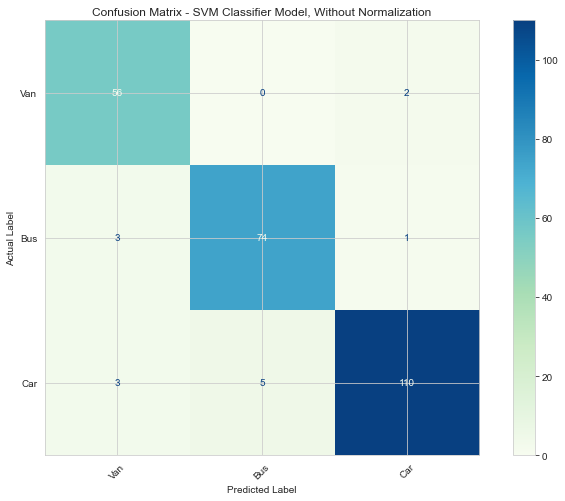

In [106]:
classNames = ['Van','Bus','Car']
labels, counts = np.unique(y, return_counts=True)
#plt.title("Confusion Matrix - SVM Classifier Model")

from sklearn.metrics import plot_confusion_matrix

np.set_printoptions(precision=2)

# Plot non-normalized & normalized confusion matrix
titles_options = [("Confusion Matrix - SVM Classifier Model, Without Normalization", None)]
                  
for title, normalize in titles_options:
    fig, ax = plt.subplots(figsize=(12,8))
    disp = plot_confusion_matrix(grid_svc_f, X_test, y_test,
                                 display_labels=classNames,
                                 cmap="GnBu",ax=ax,
                                 normalize=normalize)
    plt.ylabel("Actual Label")
    plt.xlabel("Predicted Label")
    
    tick_marks = np.arange(len(classNames))
    plt.xticks(tick_marks, classNames, rotation=45)
    plt.yticks(tick_marks, classNames)
    
    disp.ax_.set_title(title)

    print("\n",title,"\n")
    print(disp.confusion_matrix)

plt.show()

In [107]:
print('-------------Final Analysis of SVM Grid Search wihout PCA-------------------\n')
print('\nSVM Model Grid Search Accuracy Score without PCA : {:.2f} %'.format((svm_accuracy_f*100)))
print('Mean Absolute Error of SVM Grid Search without PCA : {:.2f}'.format(mean_absolute_error(y_te, svm_y_predict_f)))

precision_f, recall_f, f1_score_f, support = precision_recall_fscore_support(y_test, svm_y_predict_f, average = 'macro')
print('\nPrecision Score :', '%0.2f' % precision_f)
print('Recall Score    :', '%0.2f' % recall_f)
print('F1-Score        :', '%0.2f' % f1_score_f)
print('Accuracy Score  :','%0.2f ' % svm_accuracy_f)

print('\nSVM Classification Report : \n',classification_report(y_test, svm_y_predict_f, target_names=['Van', 'Bus', 'Car']))

-------------Final Analysis of SVM Grid Search wihout PCA-------------------


SVM Model Grid Search Accuracy Score without PCA : 94.49 %
Mean Absolute Error of SVM Grid Search without PCA : 0.84

Precision Score : 0.94
Recall Score    : 0.95
F1-Score        : 0.94
Accuracy Score  : 0.94 

SVM Classification Report : 
               precision    recall  f1-score   support

         Van       0.90      0.97      0.93        58
         Bus       0.94      0.95      0.94        78
         Car       0.97      0.93      0.95       118

    accuracy                           0.94       254
   macro avg       0.94      0.95      0.94       254
weighted avg       0.95      0.94      0.95       254



#### Dataframe of Grid Search suggested models with and without PCA

In [108]:
modellsts = []

modellsts.append(['Support Vector Classifier with PCA using Grid Search', svm_score_pca_grid * 100, svm_accuracy_pca_grid * 100, recall_pca_grid * 100, precision_pca_grid * 100])
modellsts.append(['Support Vector Classifier without PCA using Grid Search', svm_score_f * 100, svm_accuracy_f * 100, recall_f * 100, precision_f * 100])

md_df = pd.DataFrame(modellsts, columns = ['Model', 'Accuracy Score of Training Data', 'Accuracy Score of Test Data', 'Recall Score', 'Precision Score'])
md_df

,Model,Accuracy Score of Training Data,Accuracy Score of Test Data,Recall Score,Precision Score
0,Support Vector Classifier with PCA using Grid ...,92.398649,91.338583,91.060515,91.028019
1,Support Vector Classifier without PCA using Gr...,96.621622,94.488189,94.881286,93.779533


### 7.4 Modelling
- As mentioned in the list of tasks, use Naive Bayes and support vector machines. Use grid search for SVC (try C values - 0.01, 0.05, 0.5, 1 and kernel = linear, rbf) and find out the best hyper parameters and do cross validation to find the accuracy.

LR: 77.59 (0.07)
KNN: 87.24 (0.05)
NB: 73.82 (0.07)
SVC: 90.60 (0.04)
CART: 80.51 (0.04)
RF: 86.31 (0.05)


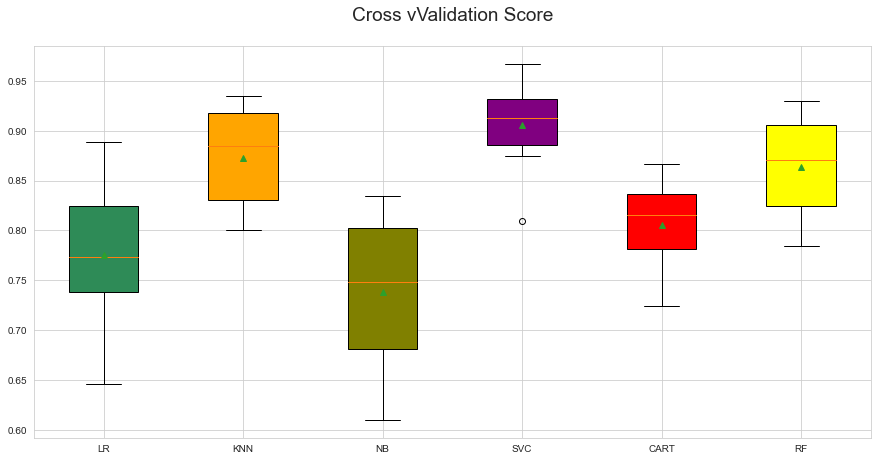

In [109]:
from matplotlib import pyplot
# Compare different models on the principal components
models = []
models.append(('LR', LogisticRegression()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('NB', GaussianNB()))
models.append(('SVC', SVC()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('RF', RandomForestClassifier()))

# evaluate each model in turn
results = []
names = []
scoring = 'f1_macro'
for name, model in models:
    skf = StratifiedKFold(n_splits = 10, random_state = random_state)
    cv_results = cross_val_score(model, X_tr, y_tr, cv = skf, scoring = scoring)
    results.append(cv_results)
    names.append(name)
    msg = "%s: %.2f (%.2f)" % (name, cv_results.mean()*100, cv_results.std())
    print(msg)

# boxplot algorithm comparison
plt.figure(figsize=(15, 7.2))
plt.title('Cross vValidation Score', fontsize = 14, y=1.05, size=19)
box = pyplot.boxplot(results, labels=names, showmeans=True,patch_artist=True)
colors = ['seagreen','orange', 'olive', 'purple', 'red', 'yellow']
for patch, color in zip(box['boxes'], colors):
    patch.set_facecolor(color)
pyplot.show()

## 8. Compare the accuracy scores and cross validation scores of Support vector machines – one trained using raw data and the other using Principal Components, and mention your findings

### 8.1 Plot training vs cross validation scores

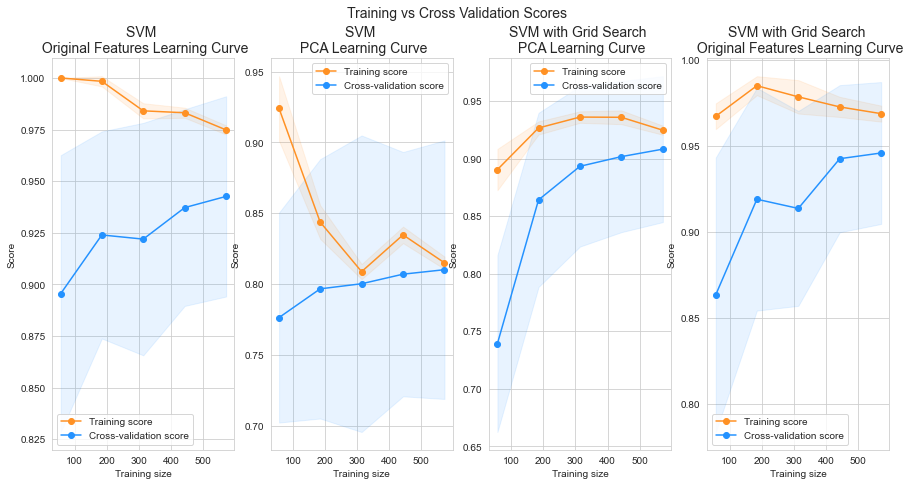

In [110]:
# Plot training vs cross validation scores
cv = StratifiedKFold(n_splits = 30, random_state = random_state)

f, ((ax1, ax2, ax3, ax4)) = plt.subplots(1, 4, figsize = (15, 7.2))
f.suptitle('Training vs Cross Validation Scores\n', fontsize = 14)

plot_learning_curve(svc_model, X_train, y_train, cv = cv, n_jobs = 1, ax = ax1,
                    name = 'SVM \n Original Features Learning Curve')

plot_learning_curve(svc_model_pca, X_tr, y_tr, cv = cv, n_jobs = 1, ax = ax2,
                    name = 'SVM \n PCA Learning Curve')

plot_learning_curve(grid_svc, X_tr, y_tr, cv = cv, n_jobs = 1, ax = ax3, 
                    name = 'SVM with Grid Search \n PCA Learning Curve')

plot_learning_curve(grid_svc_f, X_train, y_train, cv = cv, n_jobs = 1, ax = ax4,
                    name = 'SVM with Grid Search \n Original Features Learning Curve')

### 8.2 Consodilated dataframe of all models

In [111]:
modellsts1 = []

modellsts1.append(['Support Vector Classifier with PCA', svm_score_pca * 100, svm_accuracy_pca * 100, recall_pca * 100, precision_pca * 100])
modellsts1.append(['Support Vector Classifier without PCA', svm_score * 100, svm_accuracy * 100, recall * 100, precision * 100])
modellsts1.append(['Support Vector Classifier with PCA using Grid Search', svm_score_pca_grid * 100, svm_accuracy_pca_grid * 100, recall_pca_grid * 100, precision_pca_grid * 100])
modellsts1.append(['Support Vector Classifier without PCA using Grid Search', svm_score_f * 100, svm_accuracy_f * 100, recall_f * 100, precision_f * 100])

md1_df = pd.DataFrame(modellsts1, columns = ['Model', 'Accuracy Score of Training Data', 'Accuracy Score of Test Data', 'Recall Score', 'Precision Score'])
md1_df

,Model,Accuracy Score of Training Data,Accuracy Score of Test Data,Recall Score,Precision Score
0,Support Vector Classifier with PCA,81.418919,85.826772,86.425967,84.404560
1,Support Vector Classifier without PCA,97.635135,93.307087,93.157148,93.166517
2,Support Vector Classifier with PCA using Grid ...,92.398649,91.338583,91.060515,91.028019
3,Support Vector Classifier without PCA using Gr...,96.621622,94.488189,94.881286,93.779533


Text(0.5, 1.0, '\nComparison of Classification Models\n\n')

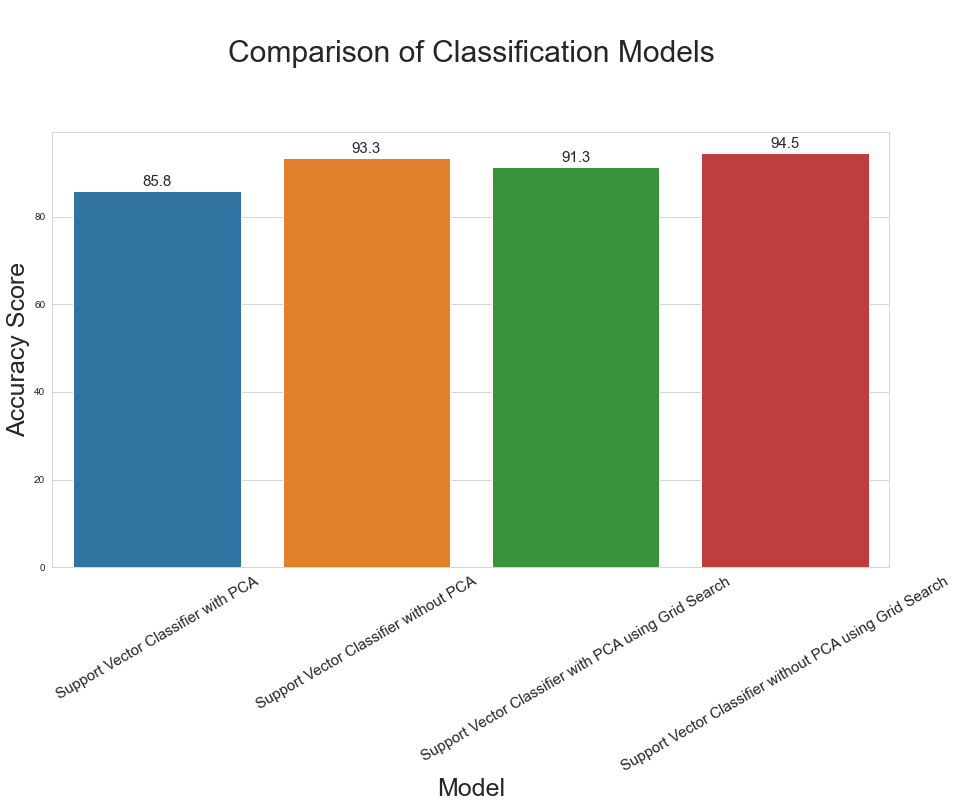

In [112]:
plt.figure(figsize=(15,8))
splot=sns.barplot(x = md1_df['Model'], y = md1_df['Accuracy Score of Test Data'], data = md1_df)
for p in splot.patches:
    splot.annotate(format(p.get_height(), '.1f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center',
                   size = 15,
                   xytext = (0, 9), 
                   textcoords = 'offset points')

splot.set_xticklabels(splot.get_xmajorticklabels(), fontsize = 15,rotation=30)    

plt.xlabel('Model', fontsize = 25)
plt.ylabel('Accuracy Score', fontsize = 25)
plt.title('\nComparison of Classification Models\n\n', fontsize = 30)

#### Observations 
- When we use the hyperparameters suggested by Grid Search:
    - The accuracy score of the PCA dataset increases by 5.11%.
    - The accuracy score of the original dataset increases by 1.58%.

#### Conclusion
We used correlation matrix and checked the relation of each feature with the class column to reduce the number of features in the dataset to 12 from 18.

PCA being a statistical technique to reduce the dimensionality of the data by the selecting the most important features that captures maximum information about the dataset, does the task here. Here we've reduced the dimension from 12 to 6 and selected those which explained 95% variance. Doing that it removes the correlated features as well, which we saw in the scatterplot before and after PCA.

However, some of the limitations which are clearly seen in this use case are: after implementing PCA on the dataset, we saw features getting converted into principal components. Principal components are the linear combination of original features. This makes the features less interpretable. Additionally, we know that one of limitation of PCA is it assumes linearity i.e. principal components are a linear combinations of the original features, which if not true will not give a sensible results..

We then applied Naive Bayes and Support Vector Classifier on the reduced features (dimensions) and got an accuracy of 67.5% and 78.3% respectively and precision (macro) score of 64% and 76% respectively. Recall (macro) score for the same was 65% and 77% respectively. We then also applied SVC on the 12 actual features (with interpretability) and saw an accuracy score of 92.9%, precision (macro) score of 92% and recall (macro) score of 93%, which is a way better score then SVC when applied on principal components.

<b>Shape of dataset we were dealing with was 846 rows and 12 features + 1 class column. Effect of PCA can be more useful in large datasets with more features.</b>

Based on learning curve, we can conclude that for Naive Bayes with principal components, both training and validation scores are volatile, however the validation score almost flattens beyond a training size of ~330. For SVC with principal components and original features, both training and validation scores increases with the increase in size of the dataset, which would mean the scores can be further increases with more training samples. Howevver, the gap between training and validation score for SVC with principal component is higher than then the others.